In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

import tqdm
import time
from datetime import date, datetime, timedelta

import torch
import torch.optim as optim
from torch.nn.utils import weight_norm
import torch.nn as nn
%matplotlib inline

from torch.utils.data import TensorDataset
from torch.utils.data import Dataset, DataLoader
import matplotlib.dates as mdates

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.font_manager as font_manager

# Use system-installed fonts instead of relying on kpsewhich
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams["mathtext.fontset"] = "stix"
plt.rcParams['text.usetex'] = False

## data load

In [3]:
data = pd.read_pickle('krx_data_5Y.pkl')
data.head(10)

,today,종가,대비,시가,고가,저가,내재변동성,익일기준가,거래량,거래대금,미결제약정,이름,분류,만기월,행사가,만기일,잔존만기,rate,kvix,주식가격
0,2019-01-02,0.91,-0.38,0.92,0.92,0.91,15.7,0.91,3,1,38,코스피200 C 201906 302.5,1,201906,302.5,2019-06-13,0.464286,1.964,19.74,258.23
1,2019-01-02,0.01,0,0.01,0.01,0.01,19.1,0.01,1,0,1090,코스피200 C 201902 312.5,1,201902,312.5,2019-02-14,0.126984,1.964,19.74,258.23
2,2019-01-02,0.02,0,0.03,0.03,0.02,17.7,0.02,7,0,549,코스피200 C 201903 322.5,1,201903,322.5,2019-03-14,0.206349,1.964,19.74,258.23
3,2019-01-02,0.68,-0.15,0.6,0.68,0.6,15.8,0.68,3,0,3,코스피200 C 201904 292.5,1,201904,292.5,2019-04-11,0.285714,1.964,19.74,258.23
4,2019-01-02,0.02,-0.01,0.03,0.03,0.02,16.3,0.02,924,5,2273,코스피200 C 201902 300.0,1,201902,300.0,2019-02-14,0.126984,1.964,19.74,258.23
5,2019-01-02,7.6,-0.85,7.6,7.6,7.6,17.5,7.60,9,17,4171,코스피200 C 201903 260.0,1,201903,260.0,2019-03-14,0.206349,1.964,19.74,258.23
6,2019-01-02,0.3,-0.28,0.72,0.72,0.28,15.3,0.30,3635,367,3509,코스피200 C 201902 282.5,1,201902,282.5,2019-02-14,0.126984,1.964,19.74,258.23
7,2019-01-02,1.05,-0.38,1.48,1.48,1.05,15.6,1.05,286,84,10239,코스피200 C 201906 300.0,1,201906,300.0,2019-06-13,0.464286,1.964,19.74,258.23
8,2019-01-02,1.93,-0.13,1.99,2.01,1.93,15.7,1.93,4,2,47,코스피200 C 201909 305.0,1,201909,305.0,2019-09-12,0.722222,1.964,19.74,258.23
9,2019-01-02,7.8,0.59,6.93,7.8,6.93,17.8,7.80,1307,2445,14973,코스피200 P 201906 250.0,0,201906,250.0,2019-06-13,0.464286,1.964,19.74,258.23


In [4]:
data_check = data[['today' , '만기일' , '잔존만기']]
print((data_check['만기일'] - data_check['today']).max())
print(data_check['잔존만기'])
print(data_check.max())

378 days 00:00:00
0         0.464286
1         0.126984
2         0.206349
3         0.285714
4         0.126984
            ...   
355819    0.043651
355820    0.043651
355821    0.043651
355822    0.043651
355823    0.043651
Name: 잔존만기, Length: 355824, dtype: float64
today    2023-12-28 00:00:00
만기일      2024-01-11 00:00:00
잔존만기                1.075397
dtype: object


In [5]:
data_check.head(100)
print((data_check['만기일'] - data_check['today']).max() , data_check['잔존만기'].max())

378 days 00:00:00 1.075396825396825


In [6]:
data['today'] = pd.to_datetime(data['today'])
data = data[data['today'] <= '2023-01-01']

data['종가'] = pd.to_numeric(data['종가'], errors='coerce')
data['주식가격'] = pd.to_numeric(data['주식가격'], errors='coerce')
data['행사가'] = pd.to_numeric(data['행사가'], errors='coerce')
data['잔존만기'] = pd.to_numeric(data['잔존만기'], errors='coerce')
data['rate'] = pd.to_numeric(data['rate'], errors='coerce')

# simple moneyness 계산
data['simple moneyness'] = data['주식가격'] / data['행사가']

# S - Ke^(-rT) 계산
data['parity'] = data['주식가격'] - (data['행사가'] * np.exp(-(data['rate'] / 100) * data['잔존만기']))

# 풋옵션 가격
data['put_price'] = data.apply(lambda row: row['종가'] - row['parity'] if row['분류'] == 1 else row['종가'], axis=1)

# 콜옵션 가격
data['call_price'] = data.apply(lambda row: row['종가'] + row['parity'] if row['분류'] == 0 else row['종가'], axis=1)

# 풋옵션 가격이 0보다 작은 경우 0으로 설정
data['put_price'] = np.where((data['분류'] == 1) & (data['put_price'] < 0), 0, data['put_price'])

# 최종 종가 설정
data['종가'] = data['put_price']

# 필요한 컬럼만 선택
data = data[['today', '분류', '거래량', '미결제약정', 'simple moneyness', '잔존만기', 'rate', 'kvix', '종가']]

# 인덱스 설정 및 결측값 제거
data.set_index('today', inplace=True)
data.dropna(how='any', inplace=True)
data.sample(10)

,분류,거래량,미결제약정,simple moneyness,잔존만기,rate,kvix,종가
today,,,,,,,,
2020-12-16,0,24630,8153,1.155132,0.087302,0.469,20.40,0.470000
2022-09-08,1,48,2889,0.710621,0.261905,2.624,19.17,122.910763
2022-08-05,1,1670,3004,0.963235,0.198413,2.183,17.00,14.850526
2020-08-03,0,152,540,1.535692,0.115079,0.554,23.52,0.070000
2022-03-21,1,16,234,1.406941,0.075397,1.282,22.40,0.000000
2021-05-28,0,5,5747,1.331094,0.297619,0.457,17.31,0.720000
2021-04-07,0,28,2965,1.273731,0.186508,0.362,17.45,0.380000
2020-08-20,0,60,19752,1.507950,0.321429,0.506,28.18,0.910000
2021-08-27,1,11,33,1.045197,0.039683,0.928,16.17,0.965487


In [7]:
data = data[['거래량','미결제약정','잔존만기','rate','kvix','simple moneyness','종가']]
data = data[data['거래량']>=1]
data.dropna(how='any',inplace=True)
data.sample(10)

,거래량,미결제약정,잔존만기,rate,kvix,simple moneyness,종가
today,,,,,,,
2021-12-07,7093,6398,0.111111,1.018,18.48,0.943595,23.895202
2020-06-03,1147,1091,0.107143,0.379,25.74,1.229720,0.480000
2022-07-06,5,199,0.285714,1.787,24.67,1.314261,0.950000
2022-01-28,1,10291,0.376984,1.198,23.97,0.994389,19.350000
2020-09-03,2022,2387,0.103175,0.319,25.30,0.872910,46.130711
2019-08-06,65,330,0.369048,1.545,20.62,0.897027,28.583829
2021-06-01,52218,14261,0.031746,0.449,16.48,1.056000,0.260000
2020-01-07,2,96,0.448413,1.407,15.08,1.109448,2.580000
2020-02-12,153,4679,0.861111,1.256,16.95,0.837611,56.097380


In [8]:
data.rename(columns = { '거래량' : 'volume','미결제약정' : 'open_interest', '잔존만기' : 'maturity'} , inplace = True)
data.sample(10)
print(data['open_interest'].min(), data['open_interest'].max())

0 159624


In [9]:
# check version
from pycaret.utils import version
version()

/home/jupyter-jihong0429/.local/lib/python3.10/site-packages/pycaret/internal/logging.py:148: UserWarning: Could not attach a FileHandler to the logger at path logs.log! No logs will be saved.
  warnings.warn(
Traceback (most recent call last):
  File "/home/jupyter-jihong0429/.local/lib/python3.10/site-packages/pycaret/internal/logging.py", line 146, in create_logger
    ch = logging.FileHandler(path)
  File "/opt/tljh/user/lib/python3.10/logging/__init__.py", line 1169, in __init__
    StreamHandler.__init__(self, self._open())
  File "/opt/tljh/user/lib/python3.10/logging/__init__.py", line 1201, in _open
    return open_func(self.baseFilename, self.mode,
PermissionError: [Errno 13] Permission denied: '/home/jupyter-jihong0429/anomal/anomaly_score/logs.log'


'3.3.2'

In [10]:
import pycaret
import pycaret.anomaly as pyano

# IFOREST

In [11]:
data7 = data.copy()

In [12]:
data7.reset_index(drop=True, inplace=True)

In [13]:
import time
start = time.time()  # 시작 시간 저장
exp_ano = pyano.setup(data=data7 , use_gpu=True , session_id=31)
ml_model7 = pyano.create_model('iforest', fraction=0.05)
data_ano7 = pyano.assign_model( ml_model7 )
pr7 = pyano.predict_model( ml_model7 , data7 )
pr7 = pr7[pr7['Anomaly'] == 0]

print("time :", time.time() - start)

Traceback (most recent call last):
  File "/home/jupyter-jihong0429/.local/lib/python3.10/site-packages/pycaret/internal/logging.py", line 146, in create_logger
    ch = logging.FileHandler(path)
  File "/opt/tljh/user/lib/python3.10/logging/__init__.py", line 1169, in __init__
    StreamHandler.__init__(self, self._open())
  File "/opt/tljh/user/lib/python3.10/logging/__init__.py", line 1201, in _open
    return open_func(self.baseFilename, self.mode,
PermissionError: [Errno 13] Permission denied: '/home/jupyter-jihong0429/anomal/anomaly_score/logs.log'


,Description,Value
0,Session id,31
1,Original data shape,"(276942, 7)"
2,Transformed data shape,"(276942, 7)"
3,Numeric features,7
4,Preprocess,True
5,Imputation type,simple
6,Numeric imputation,mean
7,Categorical imputation,mode
8,CPU Jobs,-1
9,Use GPU,True


Processing:   0%|          | 0/3 [00:00<?, ?it/s]

time : 8.057040691375732


In [14]:
data_ano7.sample(10)

,volume,open_interest,maturity,rate,kvix,simple moneyness,종가,Anomaly,Anomaly_Score
225393,5,280,0.380952,1.728,17.600000,1.593227,0.320000,0,-0.133587
103312,12,98,0.063492,0.506,28.180000,1.049009,5.017650,0,-0.159503
79431,1,70,0.265873,0.711,40.049999,0.767905,72.765099,0,-0.075596
237343,11186,10601,0.063492,2.270,20.020000,1.014857,4.260000,0,-0.115107
176793,18862,7470,0.071429,0.667,17.240000,1.075946,0.730000,0,-0.133693
258044,1,8,0.246032,3.073,23.209999,1.513195,0.250000,0,-0.096340
55878,6,113,0.285714,1.253,14.370000,1.424156,0.080000,0,-0.169721
267365,104,1224,0.047619,3.074,17.920000,0.959114,12.850000,0,-0.106703
235457,173,8005,0.162698,2.176,23.320000,0.925303,23.950001,0,-0.136975
222081,2488,10811,0.067460,1.395,18.400000,1.451417,0.010000,0,-0.118248


## density plot

In [15]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, mark_inset

In [16]:
np.mean(data_ano7[data_ano7['Anomaly'] == 0]['maturity'])

0.2344792

#### hist plot

In [17]:
print(data_ano7["Anomaly_Score"].max() , data_ano7["Anomaly_Score"].min())

0.16899921306413346 -0.20051713757028067


In [18]:
print(data_ano7["Anomaly_Score"].mean() , data_ano7["Anomaly_Score"].std())

-0.12128345902294754 0.059191566560795626


In [19]:
data_ano7['AD_score_cls'] = ''

thr1 = 0.0
thr2 = -0.05
print(thr1, thr2)

data_ano7.loc[data_ano7['Anomaly_Score']>thr1,'AD_score_cls'] = 'extra_abnorm'
data_ano7.loc[(data_ano7['Anomaly_Score']<=thr1) & (data_ano7['Anomaly_Score']>thr2),'AD_score_cls'] = 'few_abnorm'
data_ano7.loc[data_ano7['Anomaly_Score']<=thr2 ,'AD_score_cls'] = 'norm'

data_ano7.sample(10)

0.0 -0.05


,volume,open_interest,maturity,rate,kvix,simple moneyness,종가,Anomaly,Anomaly_Score,AD_score_cls
262886,420,1207,0.194444,2.857,20.820000,0.879629,40.411045,0,-0.114328,norm
28623,18,113,0.142857,1.828,13.670000,0.869323,40.671951,0,-0.149309,norm
50454,47,19226,0.634921,1.266,13.220000,1.210565,1.580000,0,-0.062462,norm
157568,899,1763,0.134921,0.630,14.800000,1.142805,0.390000,0,-0.173337,norm
209307,181,10350,0.226190,1.222,19.610001,1.105576,3.510000,0,-0.161893,norm
245265,20522,39455,0.043651,2.543,16.190001,0.951853,16.092796,1,0.016645,extra_abnorm
16970,5,10812,0.690476,1.895,12.920000,0.997862,11.700000,0,-0.052569,norm
7992,1,11,0.329365,1.846,15.150000,0.754728,90.311737,0,-0.117243,norm
206382,1307,1200,0.111111,1.323,28.950001,0.950694,20.740171,0,-0.150243,norm
263060,32,130,0.607143,2.885,19.990000,1.782914,0.500000,0,-0.028855,few_abnorm


In [20]:
print(np.sum(data_ano7['AD_score_cls'] == 'extra_abnorm') , np.sum(data_ano7['AD_score_cls'] == 'few_abnorm'))

13848 23250


findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

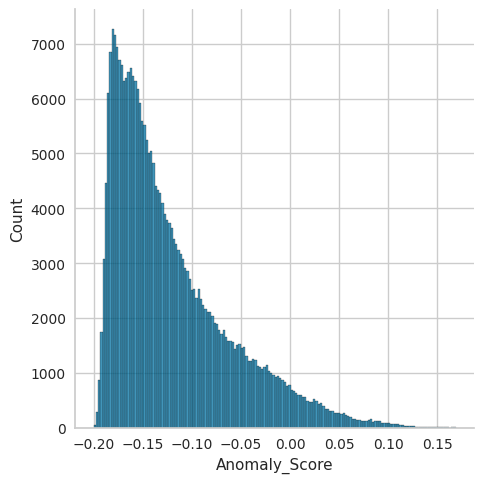

In [21]:
sns.displot(data_ano7['Anomaly_Score'])

# hist #

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


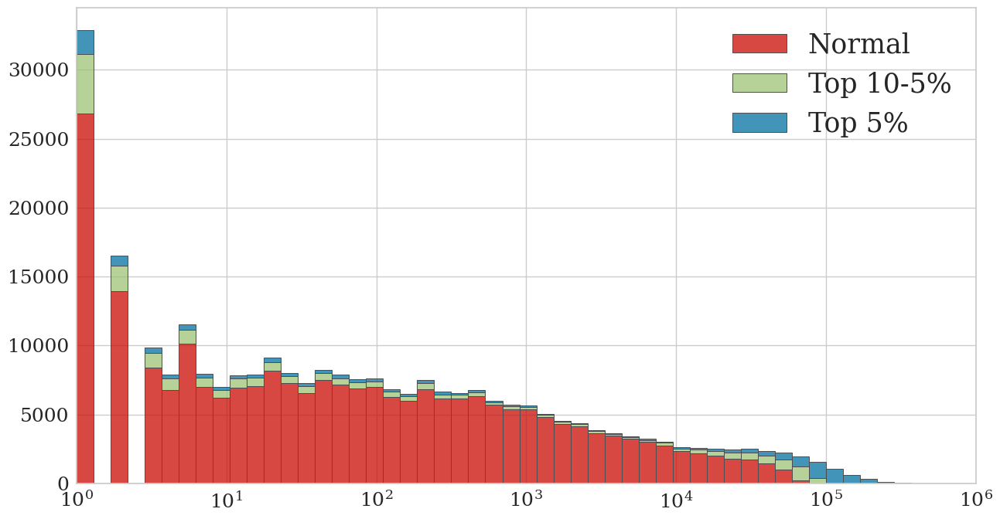

In [22]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

fig, ax = plt.subplots(figsize=(15,8))  

sns.histplot(data_ano7, x= 'volume', edgecolor=".3", log_scale=True ,
             hue='AD_score_cls', hue_order=['extra_abnorm' ,'few_abnorm' ,'norm'],
             multiple='stack' ,bins= 50 , linewidth = .7, ax=ax)

colors = [(0.3333333333333333, 0.6666666666666666, 0.6) , 
          (0.626481273849302, 0.807715928145123, 0.7705203827775002), 
          (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)]
sns.set_palette(colors)
ax.legend(labels=['Normal', 'Top 10-5%' ,'Top 5%'], fontsize=25) 
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_xlim(1 , 1000000) ## 4부터 시작
ax.tick_params(axis='both', which='major', labelsize=18)
plt.grid(visible=True)
plt.savefig('volume_histplot.eps', format='eps', dpi=300, bbox_inches='tight')
plt.show()

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


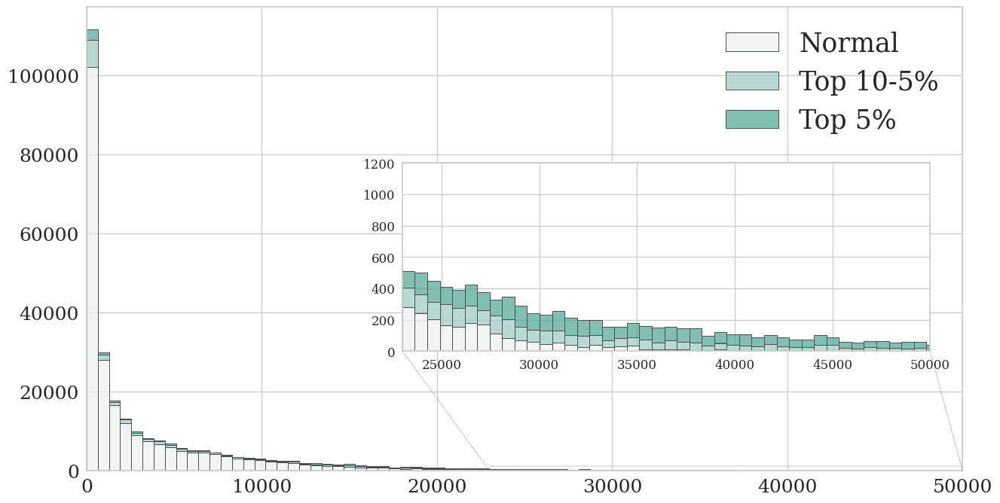

In [23]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 색상 팔레트
colors = [
    (0.3333333333333333, 0.6666666666666666, 0.6),
    (0.626481273849302, 0.807715928145123, 0.7705203827775002),
    (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)
]
sns.set_palette(colors)

# 메인 플롯
fig, ax = plt.subplots(figsize=(15, 8))
sns.histplot(
    data=data_ano7,
    x='open_interest',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=250,
    linewidth=.7,
    ax=ax
)
ax.set_xlim(0.0, 50000)
ax.legend(labels=['Normal', 'Top 10-5%', 'Top 5%'], fontsize=25)
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', which='major', labelsize=18)

# inset axes
axins = inset_axes(ax, width=7, height=2.5, loc=3, bbox_to_anchor=(0.4, 0.3), bbox_transform=ax.figure.transFigure)
axins.xaxis.get_major_locator().set_params(nbins=10)
sns.histplot(
    data=data_ano7,
    x='open_interest',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=250,
    linewidth=.7,
    ax=axins
).get_legend().remove()
axins.set_xlim(23000, 50000)
axins.set_ylim(0.0, 1200)
axins.set_xlabel('')
axins.set_ylabel('')
axins.tick_params(axis='both', which='major', labelsize=12)

mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")
plt.xscale('linear')
plt.grid(visible=True)

# EPS 저장
plt.savefig('open_interest_histplot_with_inset.eps', format='eps', dpi=300, bbox_inches='tight')

plt.show()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


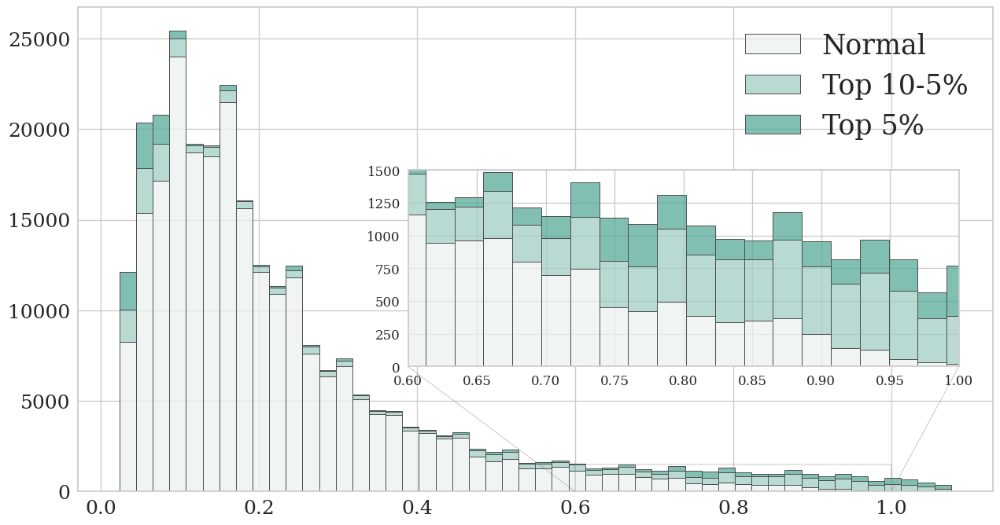

In [24]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 색상 팔레트
colors = [
    (0.3333333333333333, 0.6666666666666666, 0.6),
    (0.626481273849302, 0.807715928145123, 0.7705203827775002),
    (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)
]
sns.set_palette(colors)

# 메인 플롯
fig, ax = plt.subplots(figsize=(15, 8))
sns.histplot(
    data=data_ano7,
    x='maturity',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7,
    ax=ax
)
ax.legend(labels=['Normal', 'Top 10-5%', 'Top 5%'], fontsize=25)
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', which='major', labelsize=18)

# inset axes
axins = inset_axes(ax, width=7, height=2.5, loc=3, bbox_to_anchor=(0.4, 0.3), bbox_transform=ax.figure.transFigure)
axins.set_xlabel('')
axins.set_ylabel('')
axins.xaxis.get_major_locator().set_params(nbins=10)
sns.histplot(
    data=data_ano7,
    x='maturity',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7,
    ax=axins
).get_legend().remove()
axins.set_xlim(0.6, 1.0)
axins.set_ylim(0.0, 1500)
axins.set_xlabel('')
axins.set_ylabel('')
axins.tick_params(axis='both', which='major', labelsize=12)

mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")
plt.xscale('linear')
plt.grid(visible=True)

# EPS 저장
plt.savefig('maturity_histplot_with_inset.eps', format='eps', dpi=300, bbox_inches='tight')

plt.show()

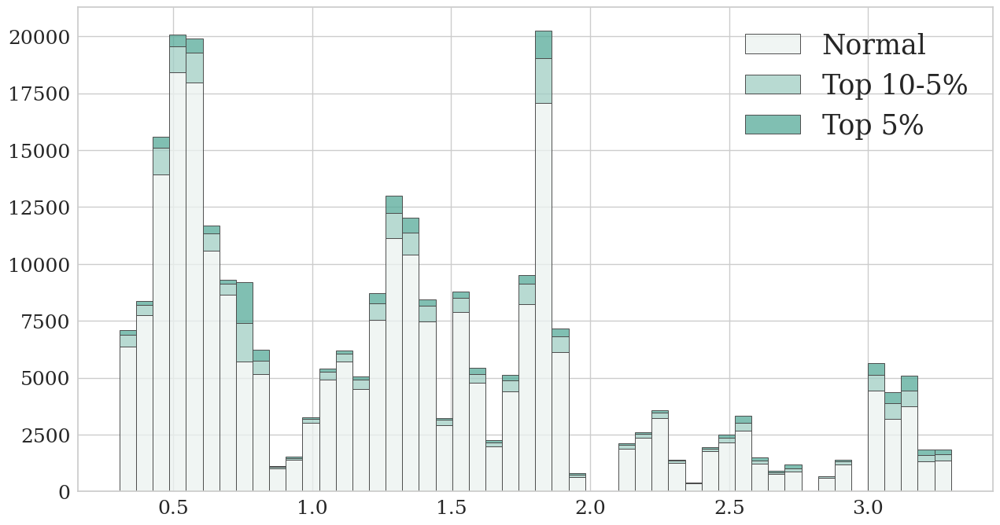

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


In [25]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

# 색상 팔레트 먼저 설정
colors = [
    (0.3333333333333333, 0.6666666666666666, 0.6),
    (0.626481273849302, 0.807715928145123, 0.7705203827775002),
    (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)
]
sns.set_palette(colors)

# 시각화
plt.figure(figsize=(15, 8))
ax = sns.histplot(
    data=data_ano7,
    x='rate',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7
)

# 레이블 및 폰트 등 세부 설정
ax.set_xlabel('')
ax.set_ylabel('')
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(visible=True)

# 범례
ax.legend(labels=['Normal', 'Top 10-5%', 'Top 5%'], fontsize=25)

# 화면 출력
plt.show()

# EPS로 저장
plt.figure(figsize=(15, 8))
ax = sns.histplot(
    data=data_ano7,
    x='rate',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7
)
ax.set_xlabel('')
ax.set_ylabel('')
plt.tick_params(axis='both', which='major', labelsize=18)
plt.grid(visible=True)
ax.legend(labels=['Normal', 'Top 10-5%', 'Top 5%'], fontsize=25)
plt.savefig('histplot_eps.eps', format='eps', dpi=300, bbox_inches='tight')
plt.close()


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


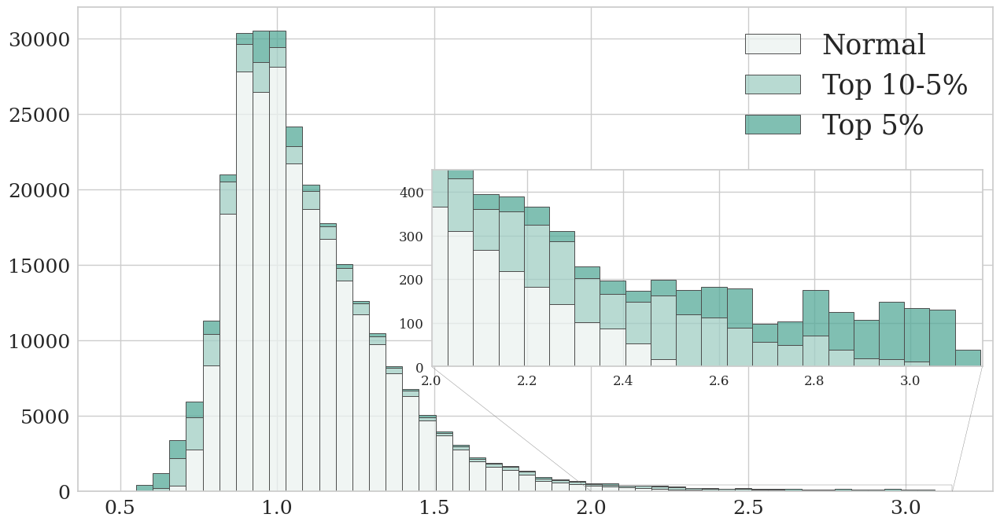

In [26]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

colors = [
    (0.3333333333333333, 0.6666666666666666, 0.6),
    (0.626481273849302, 0.807715928145123, 0.7705203827775002),
    (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)
]
sns.set_palette(colors)

fig, ax = plt.subplots(figsize=(15, 8))
sns.histplot(
    data=data_ano7,
    x='simple moneyness',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7,
    ax=ax
)
ax.legend(labels=['Normal', 'Top 10-5%', 'Top 5%'], fontsize=25)
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', which='major', labelsize=18)

# inset axes 생성
axins = inset_axes(ax, width=7, height=2.5, loc=3, bbox_to_anchor=(0.42, 0.3), bbox_transform=ax.figure.transFigure)
axins.xaxis.get_major_locator().set_params(nbins=10)

# inset plot
sns.histplot(
    data=data_ano7,
    x='simple moneyness',
    edgecolor=".3",
    hue='AD_score_cls',
    hue_order=['extra_abnorm', 'few_abnorm', 'norm'],
    multiple='stack',
    bins=50,
    linewidth=.7,
    ax=axins
)
axins.get_legend().remove()  # inset의 legend 제거
axins.set_xlim(2.0, 3.15)
axins.set_ylim(0.0, 450)
axins.set_xlabel('')
axins.set_ylabel('')
axins.tick_params(axis='both', which='major', labelsize=12)

# inset 박스 연결
mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")
plt.grid(visible=True)

# EPS로 저장
plt.savefig('histplot_with_inset.eps', format='eps', dpi=300, bbox_inches='tight')

# 화면 출력
plt.show()


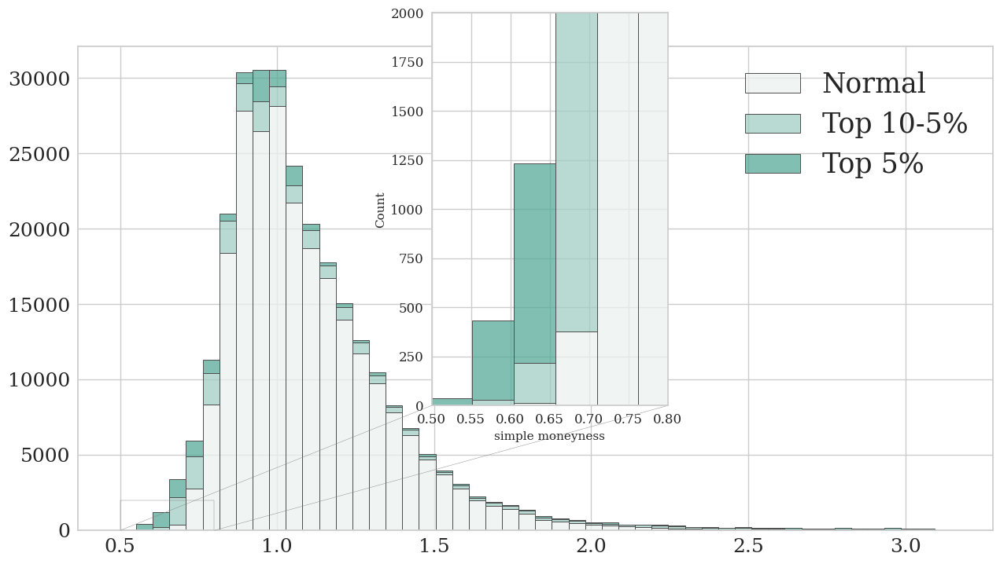

In [27]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset, inset_axes

fig, ax = plt.subplots(figsize=(15,8))
sns.histplot(data_ano7, x= 'simple moneyness', edgecolor=".3", 
             hue='AD_score_cls', hue_order=['extra_abnorm' ,'few_abnorm' ,'norm'],
             multiple='stack' ,bins= 50 , linewidth = .7)

colors = [(0.3333333333333333, 0.6666666666666666, 0.6) , (0.626481273849302, 0.807715928145123, 0.7705203827775002), (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)]
sns.set_palette(colors)
ax.legend(labels=['Normal', 'Top 10-5%' ,'Top 5%'], fontsize=25) 
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', which='major', labelsize=18)
# create zoomed-in subplot
axins = inset_axes(ax, 3,5, loc=3, bbox_to_anchor=(0.42, 0.3), bbox_transform=ax.figure.transFigure)
axins.set_xlabel('')
axins.set_ylabel('')
axins.xaxis.get_major_locator().set_params(nbins=10)

sns.histplot(data_ano7, x= 'simple moneyness', edgecolor=".3", 
             hue='AD_score_cls', hue_order=['extra_abnorm' ,'few_abnorm' ,'norm'],
             multiple='stack' ,bins= 50 , linewidth = .7, ax=axins).get_legend().remove()

colors = [(0.3333333333333333, 0.6666666666666666, 0.6) , (0.626481273849302, 0.807715928145123, 0.7705203827775002), (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)]
sns.set_palette(colors)

axins.set_xlim(0.5, 0.8)
axins.set_ylim(0.0, 2000)
axins.tick_params(axis='both', which='major', labelsize=12)
mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")
plt.grid(visible=True)
plt.show()

In [28]:
data_ano7.columns

Index(['volume', 'open_interest', 'maturity', 'rate', 'kvix',
       'simple moneyness', '종가', 'Anomaly', 'Anomaly_Score', 'AD_score_cls'],
      dtype='object')

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


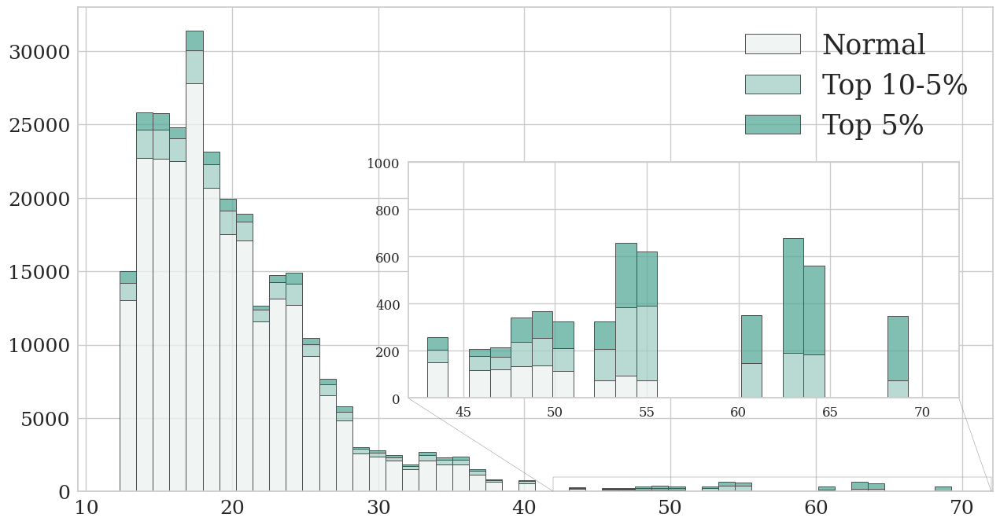

In [29]:
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

fig, ax = plt.subplots(figsize=(15,8))
sns.histplot(data_ano7, x= 'kvix', edgecolor=".3", 
             hue='AD_score_cls', hue_order=['extra_abnorm' ,'few_abnorm' ,'norm'],
             multiple='stack' ,bins= 50 , linewidth = .7)

colors = [(0.3333333333333333, 0.6666666666666666, 0.6) , (0.626481273849302, 0.807715928145123, 0.7705203827775002), (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)]
sns.set_palette(colors)
ax.legend(labels=['Normal', 'Top 10-5%' ,'Top 5%'], fontsize=25) 
ax.set_xlabel('')
ax.set_ylabel('')
ax.tick_params(axis='both', which='major', labelsize=18)
# create zoomed-in subplot
axins = inset_axes(ax, 7,3, loc=3, bbox_to_anchor=(0.4, 0.25), bbox_transform=ax.figure.transFigure)

sns.histplot(data_ano7, x= 'kvix', edgecolor=".3", 
             hue='AD_score_cls', hue_order=['extra_abnorm' ,'few_abnorm' ,'norm'],
             multiple='stack' ,bins= 50 , linewidth = .7, ax=axins).get_legend().remove()

colors = [(0.3333333333333333, 0.6666666666666666, 0.6) , (0.626481273849302, 0.807715928145123, 0.7705203827775002), (0.9219374658653965, 0.9498758137297091, 0.9423834457343508)]
sns.set_palette(colors)

axins.set_xlim(42, 72)
axins.set_ylim(0.0, 1000)
axins.set_ylabel('')
axins.set_xlabel('')
axins.tick_params(axis='both', which='major', labelsize=12)
mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="0.5")
plt.grid(visible=True)
plt.savefig('kvix_histplot_with_inset.eps', format='eps', dpi=300, bbox_inches='tight')
plt.show()

In [30]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import datetime
from datetime import datetime

import tqdm

import warnings
warnings.filterwarnings(action='ignore') 

In [31]:
data=pd.read_pickle('krx_data_5Y.pkl')

In [32]:
data.shape

(355824, 20)

In [33]:
data['종가'] = pd.to_numeric(data['종가'], errors='coerce')
data['주식가격'] = pd.to_numeric(data['주식가격'], errors='coerce')
data['행사가'] = pd.to_numeric(data['행사가'], errors='coerce')
data['잔존만기'] = pd.to_numeric(data['잔존만기'], errors='coerce')
data['rate'] = pd.to_numeric(data['rate'], errors='coerce')

# # S - Ke^(-rT) 계산
data['parity'] = data['주식가격'] - (data['행사가'] * np.exp(-(data['rate'] / 100) * data['잔존만기']))

# # 풋옵션 가격
data['put_price'] = data.apply(lambda row: row['종가'] - row['parity'] if row['분류'] == 1 else row['종가'], axis=1)

# 콜옵션 가격
data['call_price'] = data.apply(lambda row: row['종가'] + row['parity'] if row['분류'] == 0 else row['종가'], axis=1)

# 풋옵션 가격이 0보다 작은 경우 0으로 설정
data['put_price'] = np.where((data['분류'] == 1) & (data['put_price'] < 0), 0, data['put_price'])

# 최종 종가 설정
data['종가'] = data['put_price']

# 필요한 컬럼만 선택
data = data[['today', '거래량', '미결제약정', '주식가격', '행사가', '잔존만기', 'rate', 'kvix', '종가']]

# 인덱스 설정 및 결측값 제거
#data.set_index('today', inplace=True)
data.dropna(how='any', inplace=True)

In [34]:
data['today'] = pd.to_datetime(data['today'])

In [35]:
data['today']

0        2019-01-02
1        2019-01-02
2        2019-01-02
3        2019-01-02
4        2019-01-02
            ...    
355819   2023-12-28
355820   2023-12-28
355821   2023-12-28
355822   2023-12-28
355823   2023-12-28
Name: today, Length: 346675, dtype: datetime64[ns]

In [36]:
# 시간 분할 설정
time_splits = [
    ('2019-01-01', '2019-12-31', '2020-01-01', '2020-06-30'),
    ('2019-07-01', '2020-06-30', '2020-07-01', '2020-12-31'),
    ('2020-01-01', '2020-12-31', '2021-01-01', '2021-06-30'),
    ('2020-07-01', '2021-06-30', '2021-07-01', '2021-12-31'),
    ('2021-01-01', '2021-12-31', '2022-01-01', '2022-06-30'),
    ('2021-07-01', '2022-06-30', '2022-07-01', '2022-12-31'),
    ('2022-01-01', '2022-12-31', '2023-01-01', '2023-06-30'),
    ('2022-07-01', '2023-06-30', '2023-07-01', '2023-12-31')
]

# 시간 분할을 적용하고 데이터를 저장하는 함수
def apply_and_save_splits(data, time_splits):
    for idx, (train_start, train_end, test_start, test_end) in enumerate(time_splits):
        # 훈련 및 테스트 데이터 분할
        data_train_val = data[(data['today'] >= train_start) & (data['today'] <= train_end)].reset_index(drop=True)
        data_test = data[(data['today'] >= test_start) & (data['today'] <= test_end)].reset_index(drop=True)
        
        # 파일 이름 정의
        train_file_name = f'krx_train_data_{train_start}_to_{train_end}.pkl'
        test_file_name = f'krx_test_data_{test_start}_to_{test_end}.pkl'
        
        # 파일 경로 설정
        train_file_path = f'data/{train_file_name}'
        test_file_path = f'data/{test_file_name}'
        
        # 데이터 저장
        data_train_val.to_pickle(train_file_path)
        data_test.to_pickle(test_file_path)
        
        # 저장 상태 출력
        print(f'Train data saved: {train_file_name}, Test data saved: {test_file_name}')

# 함수 실행
apply_and_save_splits(data, time_splits)

Train data saved: krx_train_data_2019-01-01_to_2019-12-31.pkl, Test data saved: krx_test_data_2020-01-01_to_2020-06-30.pkl
Train data saved: krx_train_data_2019-07-01_to_2020-06-30.pkl, Test data saved: krx_test_data_2020-07-01_to_2020-12-31.pkl
Train data saved: krx_train_data_2020-01-01_to_2020-12-31.pkl, Test data saved: krx_test_data_2021-01-01_to_2021-06-30.pkl
Train data saved: krx_train_data_2020-07-01_to_2021-06-30.pkl, Test data saved: krx_test_data_2021-07-01_to_2021-12-31.pkl
Train data saved: krx_train_data_2021-01-01_to_2021-12-31.pkl, Test data saved: krx_test_data_2022-01-01_to_2022-06-30.pkl
Train data saved: krx_train_data_2021-07-01_to_2022-06-30.pkl, Test data saved: krx_test_data_2022-07-01_to_2022-12-31.pkl
Train data saved: krx_train_data_2022-01-01_to_2022-12-31.pkl, Test data saved: krx_test_data_2023-01-01_to_2023-06-30.pkl
Train data saved: krx_train_data_2022-07-01_to_2023-06-30.pkl, Test data saved: krx_test_data_2023-07-01_to_2023-12-31.pkl


In [37]:
import pandas as pd

# Load the two datasets
data1_train_path = 'data/krx_train_data_2019-01-01_to_2019-12-31.pkl'
data1_test_path = 'data/krx_test_data_2020-01-01_to_2020-06-30.pkl'
data2_train_path = 'data/krx_train_data_2019-07-01_to_2020-06-30.pkl'
data2_test_path = 'data/krx_test_data_2020-07-01_to_2020-12-31.pkl'
data3_train_path = 'data/krx_train_data_2020-01-01_to_2020-12-31.pkl'
data3_test_path = 'data/krx_test_data_2021-01-01_to_2021-06-30.pkl'
data4_train_path = 'data/krx_train_data_2020-07-01_to_2021-06-30.pkl'
data4_test_path = 'data/krx_test_data_2021-07-01_to_2021-12-31.pkl'
data5_train_path = 'data/krx_train_data_2021-01-01_to_2021-12-31.pkl'
data5_test_path = 'data/krx_test_data_2022-01-01_to_2022-06-30.pkl'
data6_train_path = 'data/krx_train_data_2021-07-01_to_2022-06-30.pkl'
data6_test_path = 'data/krx_test_data_2022-07-01_to_2022-12-31.pkl'
data7_train_path = 'data/krx_train_data_2022-01-01_to_2022-12-31.pkl'
data7_test_path = 'data/krx_test_data_2023-01-01_to_2023-06-30.pkl'
data8_train_path = 'data/krx_train_data_2022-07-01_to_2023-06-30.pkl'
data8_test_path = 'data/krx_test_data_2023-07-01_to_2023-12-31.pkl'

# Pickle 파일 불러오기
data1_train = pd.read_pickle(data1_train_path)
data1_test = pd.read_pickle(data1_test_path)
data2_train = pd.read_pickle(data2_train_path)
data2_test = pd.read_pickle(data2_test_path)
data3_train = pd.read_pickle(data3_train_path)
data3_test = pd.read_pickle(data3_test_path)
data4_train = pd.read_pickle(data4_train_path)
data4_test = pd.read_pickle(data4_test_path)
data5_train = pd.read_pickle(data5_train_path)
data5_test = pd.read_pickle(data5_test_path)
data6_train = pd.read_pickle(data6_train_path)
data6_test = pd.read_pickle(data6_test_path)
data7_train = pd.read_pickle(data7_train_path)
data7_test = pd.read_pickle(data7_test_path)
data8_train = pd.read_pickle(data8_train_path)
data8_test = pd.read_pickle(data8_test_path)

data1_train_info = data1_train.info()
data1_test_info = data1_test.info()
data2_train_info = data2_train.info()
data2_test_info = data2_test.info()
data3_train_info = data3_train.info()
data3_test_info = data3_test.info()
data4_train_info = data4_train.info()
data4_test_info = data4_test.info()
data5_train_info = data5_train.info()
data5_test_info = data5_test.info()
data6_train_info = data6_train.info()
data6_test_info = data6_test.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60665 entries, 0 to 60664
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   today   60665 non-null  datetime64[ns]
 1   거래량     60665 non-null  int64         
 2   미결제약정   60665 non-null  int64         
 3   주식가격    60665 non-null  float64       
 4   행사가     60665 non-null  float64       
 5   잔존만기    60665 non-null  float64       
 6   rate    60665 non-null  float64       
 7   kvix    60665 non-null  float64       
 8   종가      60665 non-null  float64       
dtypes: datetime64[ns](1), float64(6), int64(2)
memory usage: 4.2 MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33379 entries, 0 to 33378
Data columns (total 9 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   today   33379 non-null  datetime64[ns]
 1   거래량     33379 non-null  int64         
 2   미결제약정   33379 non-null  int64         
 3   주식가격  

In [38]:
import os

# Create the directory if it doesn't exist
output_dir = 'plot/EDA_plot'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

In [39]:
# 한글 컬럼을 영어로 변환하는 딕셔너리 생성
column_mapping = {
    '거래량': 'volume',
    '미결제약정': 'open interest',
    '주식가격': 'stock price',
    '행사가': 'strike price',
    '잔존만기': 'time to maturity',
    'rate': 'rate',  
    'kvix': 'kvix',  
    '종가': 'close price'
}

# 각 데이터에 대해 컬럼명을 영어로 변환하고 'today'를 인덱스로 설정하는 코드
def rename_and_set_index(data_train, data_test):
    data_train = data_train.rename(columns=column_mapping)
    data_test = data_test.rename(columns=column_mapping)
    
    # 'today' 컬럼을 인덱스로 설정
    data_train.set_index('today', inplace=True)
    data_test.set_index('today', inplace=True)
    
    return data_train, data_test

# 각 데이터셋에 적용
data1_train, data1_test = rename_and_set_index(data1_train, data1_test)
data2_train, data2_test = rename_and_set_index(data2_train, data2_test)
data3_train, data3_test = rename_and_set_index(data3_train, data3_test)
data4_train, data4_test = rename_and_set_index(data4_train, data4_test)
data5_train, data5_test = rename_and_set_index(data5_train, data5_test)
data6_train, data6_test = rename_and_set_index(data6_train, data6_test)
data7_train, data7_test = rename_and_set_index(data7_train, data7_test)
data8_train, data8_test = rename_and_set_index(data8_train, data8_test)

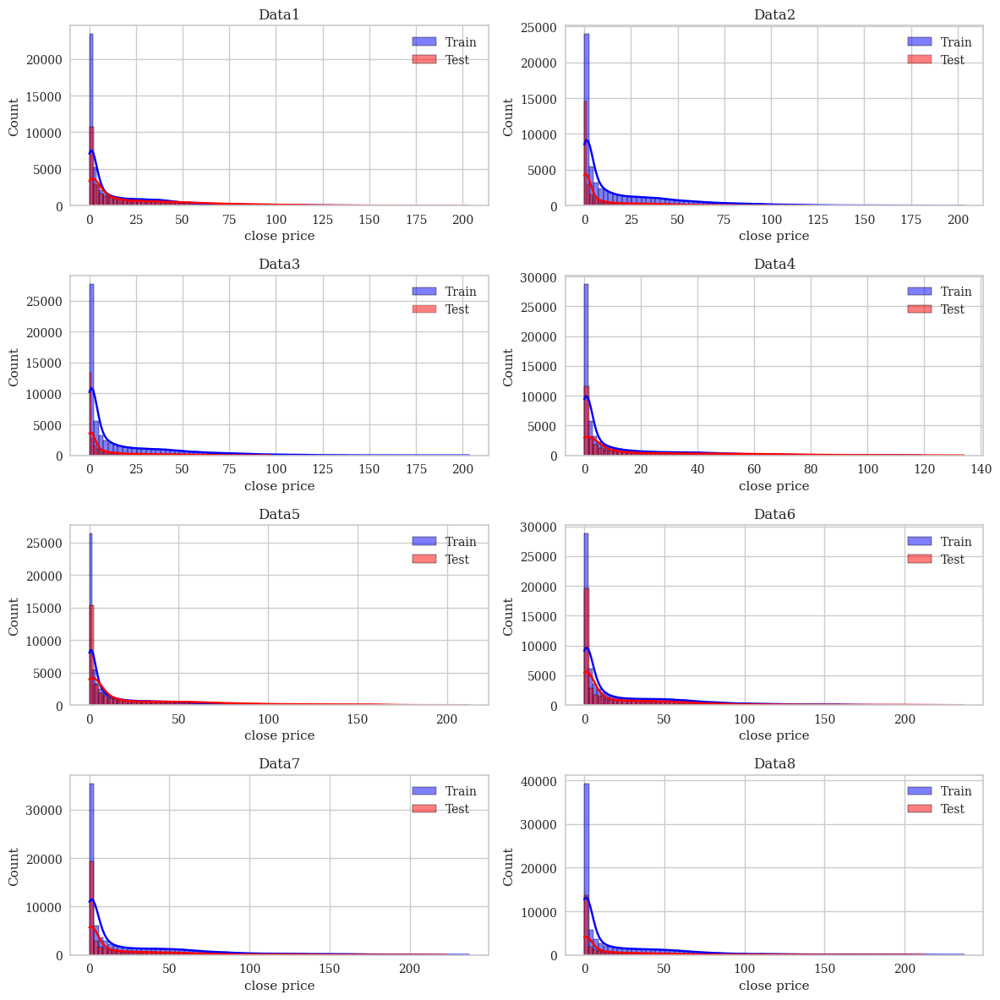

In [40]:
plt.figure(figsize=(12, 12))  

plt.subplot(4, 2, 1)
sns.histplot(data1_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data1_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data1')
plt.legend()

plt.subplot(4, 2, 2)
sns.histplot(data2_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data2_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data2')
plt.legend()

plt.subplot(4, 2, 3)
sns.histplot(data3_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data3_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data3')
plt.legend()

plt.subplot(4, 2, 4)
sns.histplot(data4_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data4_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data4')
plt.legend()

plt.subplot(4, 2, 5)
sns.histplot(data5_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data5_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data5')
plt.legend()

plt.subplot(4, 2, 6)
sns.histplot(data6_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data6_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data6')
plt.legend()

plt.subplot(4, 2, 7)
sns.histplot(data7_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data7_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data7')
plt.legend()

plt.subplot(4, 2, 8)
sns.histplot(data8_train['close price'], kde=True, bins=80, color='blue', label='Train')
sns.histplot(data8_test['close price'], kde=True, bins=80, color='red', label='Test')
plt.title('Data8')
plt.legend()

plt.tight_layout()
plt.show()

In [41]:
import matplotlib.pyplot as plt
import seaborn as sns

# Moneyness 계산 (각 데이터셋에 대해)
data1_train['moneyness'] = data1_train['stock price'] / data1_train['strike price']
data1_test['moneyness'] = data1_test['stock price'] / data1_test['strike price']
data2_train['moneyness'] = data2_train['stock price'] / data2_train['strike price']
data2_test['moneyness'] = data2_test['stock price'] / data2_test['strike price']
data3_train['moneyness'] = data3_train['stock price'] / data3_train['strike price']
data3_test['moneyness'] = data3_test['stock price'] / data3_test['strike price']
data4_train['moneyness'] = data4_train['stock price'] / data4_train['strike price']
data4_test['moneyness'] = data4_test['stock price'] / data4_test['strike price']
data5_train['moneyness'] = data5_train['stock price'] / data5_train['strike price']
data5_test['moneyness'] = data5_test['stock price'] / data5_test['strike price']
data6_train['moneyness'] = data6_train['stock price'] / data6_train['strike price']
data6_test['moneyness'] = data6_test['stock price'] / data6_test['strike price']
data7_train['moneyness'] = data7_train['stock price'] / data7_train['strike price']
data7_test['moneyness'] = data7_test['stock price'] / data7_test['strike price']
data8_train['moneyness'] = data8_train['stock price'] / data8_train['strike price']
data8_test['moneyness'] = data8_test['stock price'] / data8_test['strike price']

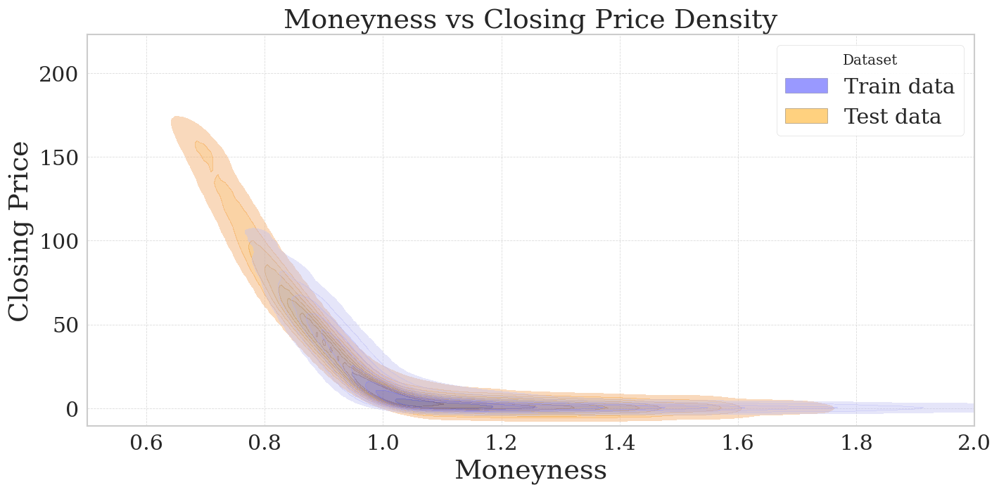

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# --- 그래프 공통 설정 ---
xlim_range = (0.5, 2.0)

# 색상 및 alpha
train_color = 'blue'
train_alpha = 0.4
test_color = 'orange'
test_alpha = 0.5

# KDE 매개변수
bw_adjust = 0.5
thresh = 0.05

# 폰트 크기 및 스타일
title_fontsize = 23
label_fontsize = 23
tick_fontsize = 18
legend_fontsize = 18
fontweight = 'normal'

###############################################################################
# Data5 그래프
###############################################################################
fig, ax = plt.subplots(1, 1, figsize=(12, 6), dpi=120)

# Test 데이터 KDE
sns.kdeplot(
    x='moneyness',
    y='close price',
    data=data5_test,
    color=test_color,
    alpha=test_alpha,
    ax=ax,
    fill=True,
    bw_adjust=bw_adjust,
    thresh=thresh,
    linewidth=1.5
)

# Train 데이터 KDE
sns.kdeplot(
    x='moneyness',
    y='close price',
    data=data5_train,
    color=train_color,
    alpha=train_alpha,
    ax=ax,
    fill=True,
    bw_adjust=bw_adjust,
    thresh=thresh,
    linewidth=1.5
)

# 제목 및 축 라벨
ax.set_title('Moneyness vs Closing Price Density',
             fontsize=title_fontsize, fontweight=fontweight)
ax.set_xlabel('Moneyness', fontsize=label_fontsize, fontweight=fontweight)
ax.set_ylabel('Closing Price', fontsize=label_fontsize, fontweight=fontweight)

# x축 한계 설정
ax.set_xlim(xlim_range)

# 틱 폰트 크기
ax.tick_params(axis='both', labelsize=tick_fontsize)

# 격자선
ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.7)

# 수동으로 범례 핸들 생성
legend_handles = [
    Patch(facecolor=train_color, edgecolor='black',
          alpha=train_alpha, label='Train data'),
    Patch(facecolor=test_color, edgecolor='black',
          alpha=test_alpha, label='Test data')
]

# 범례 추가: 오른쪽 상단
ax.legend(
    handles=legend_handles,
    title='Dataset',
    loc='upper right',
    frameon=True,
    framealpha=0.9,
    fontsize=legend_fontsize
)

# 최종 저장 및 출력
plt.tight_layout()
plt.savefig(
    'data5_moneyness_splits_transparent.pdf',
    format='pdf',
    bbox_inches='tight',
    transparent=True
)
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

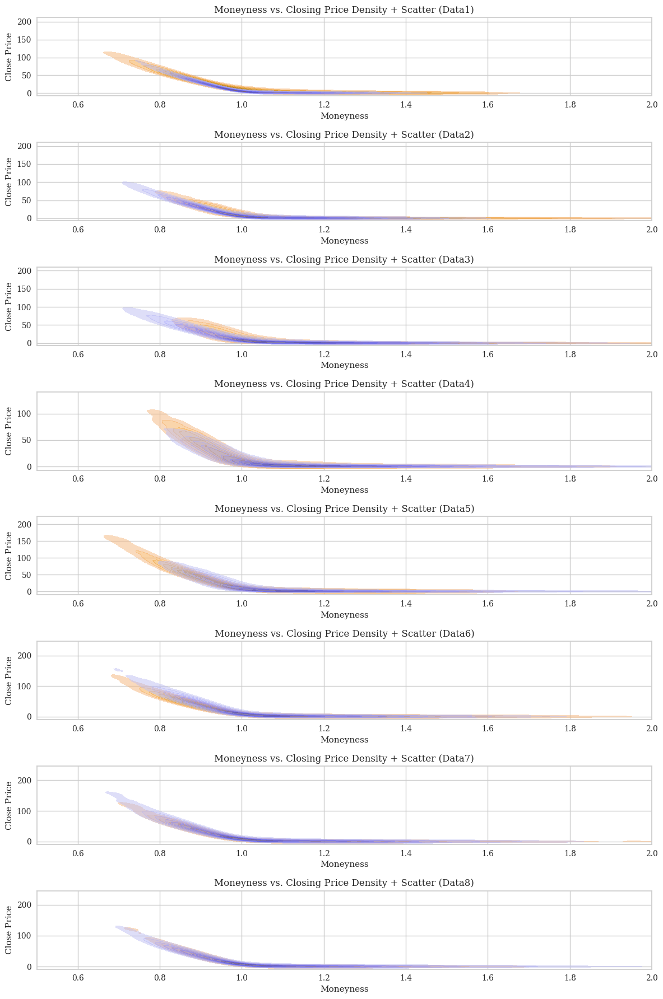

In [43]:
import matplotlib.pyplot as plt
import seaborn as sns

# 그래프 크기 설정
fig, axs = plt.subplots(8, 1, figsize=(12, 18))  # 6행 1열로 배치, 크기를 조정
xlim_range = (0.5, 2.0)  # x축 범위 설정

# Train 색상 및 마커 설정
train_color = 'blue'
train_marker = 'o'  # 원형 마커
train_size = 10  # Train 데이터의 마커 크기 설정
train_alpha = 0.75  # 불투명도 설정

# Test 색상 및 마커 설정
test_color = 'orange'
test_marker = 'X'  # X 마커
test_size = 10  # Test 데이터의 마커 크기 설정
test_alpha = 0.25  # 불투명도 설정

# KDE 매개변수
bw_adjust = 0.5  # 커널 폭을 줄여서 밀도를 더 명확히 강조
thresh = 0.1  # 밀도가 0.1 이하인 영역은 채우지 않음

for i, (train_data, test_data, label) in enumerate([
    (data1_train, data1_test, 'Data1'),
    (data2_train, data2_test, 'Data2'),
    (data3_train, data3_test, 'Data3'),
    (data4_train, data4_test, 'Data4'),
    (data5_train, data5_test, 'Data5'),
    (data6_train, data6_test, 'Data6'),
    (data7_train, data7_test, 'Data7'),
    (data8_train, data8_test, 'Data8')
]):
    # Train 데이터의 밀도 플롯
    sns.kdeplot(x='moneyness', y='close price', data=test_data, color=test_color, alpha=0.5, ax=axs[i], fill=True, bw_adjust=bw_adjust, thresh=thresh)
    sns.kdeplot(x='moneyness', y='close price', data=train_data, color=train_color, alpha=0.5, ax=axs[i], fill=True, bw_adjust=bw_adjust, thresh=thresh)
            
    axs[i].set_title(f'Moneyness vs. Closing Price Density + Scatter ({label})')
    axs[i].set_xlabel('Moneyness')
    axs[i].set_ylabel('Close Price')
    axs[i].set_xlim(xlim_range)
    axs[i].legend()

# 레이아웃 조정
plt.tight_layout()
output_path = 'moneyness_splits_enhanced_density.svg'
plt.savefig(output_path, format='svg', bbox_inches='tight')
plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

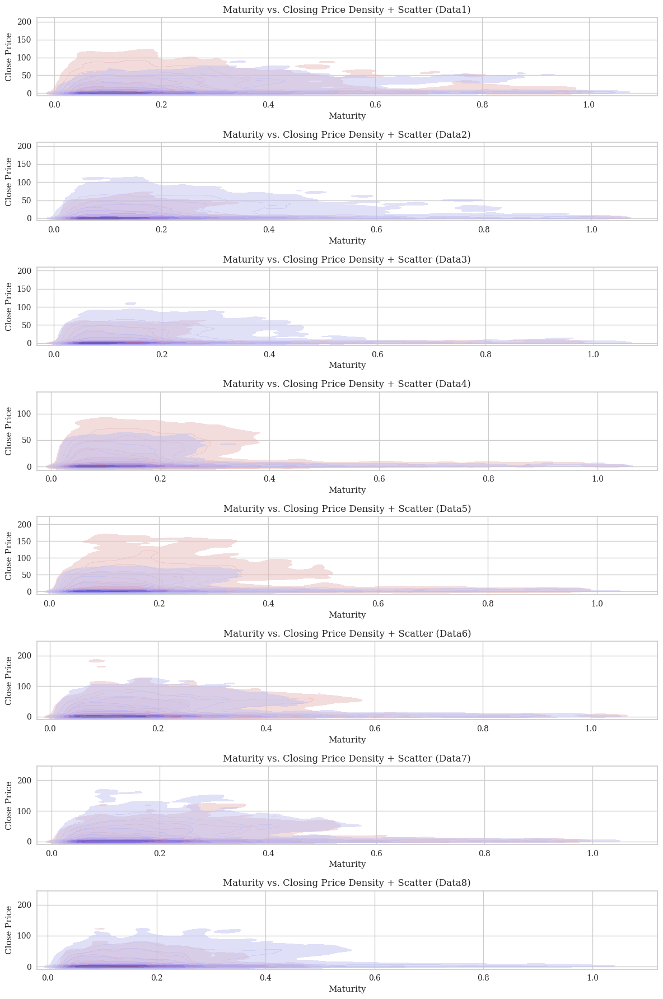

In [44]:
fig, axs = plt.subplots(8, 1, figsize=(12, 18))  # 6행 1열로 배치, 크기를 조정

# Train 색상 및 마커 설정
train_color = 'navy'
train_marker = 'o'  # 원형 마커
train_size = 10  # Train 데이터의 마커 크기 설정
train_alpha = 0.75  # 불투명도 설정

# Test 색상 및 마커 설정
test_color = 'brown'
test_marker = 'X'  # X 마커
test_size = 10  # Test 데이터의 마커 크기 설정
test_alpha = 0.25  # 불투명도 설정

# KDE 매개변수
bw_adjust = 0.5  # 커널 폭을 줄여서 밀도를 더 명확히 강조
thresh = 0.1  # 밀도가 0.1 이하인 영역은 채우지 않음
for i, (train_data, test_data, label) in enumerate([
    (data1_train, data1_test, 'Data1'),
    (data2_train, data2_test, 'Data2'),
    (data3_train, data3_test, 'Data3'),
    (data4_train, data4_test, 'Data4'),
    (data5_train, data5_test, 'Data5'),
    (data6_train, data6_test, 'Data6'),
    (data7_train, data7_test, 'Data7'),
    (data8_train, data8_test, 'Data8')
]):    # Train 데이터의 밀도 플롯
    sns.kdeplot(x='time to maturity', y='close price', data=test_data, color=test_color, alpha=0.5, ax=axs[i], fill=True, bw_adjust=bw_adjust, thresh=thresh)
    sns.kdeplot(x='time to maturity', y='close price', data=train_data, color=train_color, alpha=0.5, ax=axs[i], fill=True, bw_adjust=bw_adjust, thresh=thresh)
    
    axs[i].set_title(f'Maturity vs. Closing Price Density + Scatter ({label})')
    axs[i].set_xlabel('Maturity')
    axs[i].set_ylabel('Close Price')
    axs[i].set_xlim()
    axs[i].legend()

# 레이아웃 조정
plt.tight_layout()
output_path = 'maturity_density.svg'
plt.savefig(output_path, format='svg', bbox_inches='tight')
plt.show()

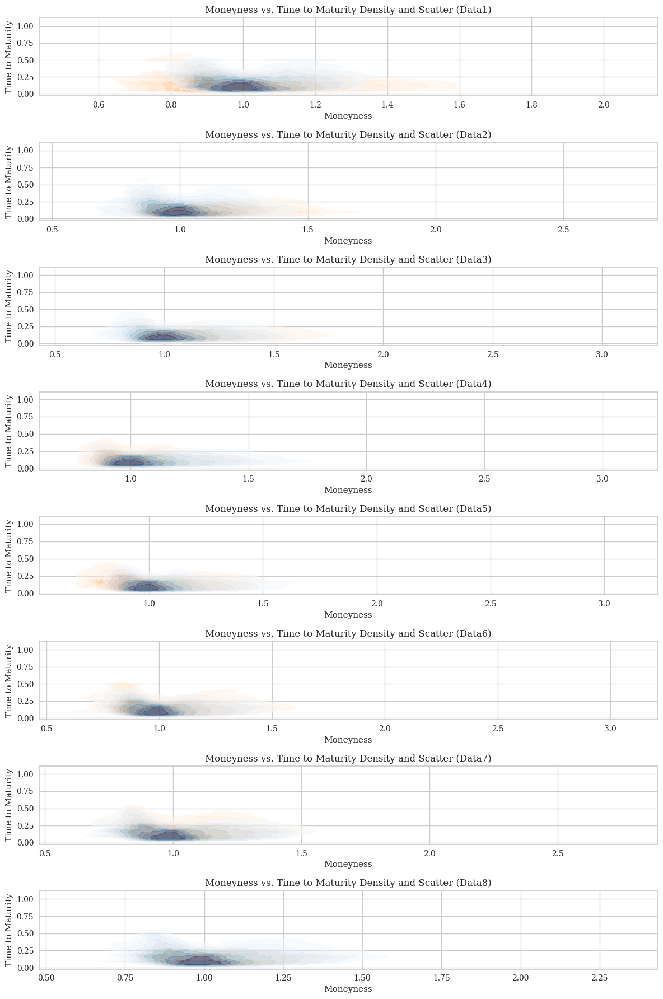

In [45]:
fig, axs = plt.subplots(8, 1, figsize=(12, 18))  # 6행 1열로 배치, 크기를 조정

# Train 색상 및 마커 설정
train_color = 'navy'
train_edgecolor = 'black'
train_marker = 'o'  # 원형 마커
train_size = 10  # Train 데이터의 마커 크기 설정
train_alpha = 0.5  # 불투명도 설정

# Test 색상 및 마커 설정
test_color = 'darkorange'
test_edgecolor = 'black'
test_marker = 'X'  # X 마커
test_size = 10  # Test 데이터의 마커 크기 설정
test_alpha = 0.25  # 불투명도 설정

# KDE 매개변수
bw_adjust = 0.5  # 커널 폭을 줄여서 밀도를 더 명확히 강조
thresh = 0.25  # 밀도가 0.1 이하인 영역은 채우지 않음

# 반복적으로 각 데이터의 밀도 플롯을 그리기
for i, (train_data, test_data, label) in enumerate([
    (data1_train, data1_test, 'Data1'),
    (data2_train, data2_test, 'Data2'),
    (data3_train, data3_test, 'Data3'),
    (data4_train, data4_test, 'Data4'),
    (data5_train, data5_test, 'Data5'),
    (data6_train, data6_test, 'Data6'),
    (data7_train, data7_test, 'Data7'),
    (data8_train, data8_test, 'Data8')
]):
    # Test 데이터의 밀도 플롯
    sns.kdeplot(x='moneyness', y='time to maturity', data=test_data, cmap='Oranges', fill=True, alpha=0.5, ax=axs[i], bw_adjust=bw_adjust, thresh=thresh)
    
    # Train 데이터의 밀도 플롯
    sns.kdeplot(x='moneyness', y='time to maturity', data=train_data, cmap='Blues', fill=True, alpha=0.5, ax=axs[i], bw_adjust=bw_adjust, thresh=thresh)

    axs[i].set_title(f'Moneyness vs. Time to Maturity Density and Scatter ({label})')
    axs[i].set_xlabel('Moneyness')
    axs[i].set_ylabel('Time to Maturity')
    axs[i].set_xlim()

# 레이아웃 조정
plt.tight_layout()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that 

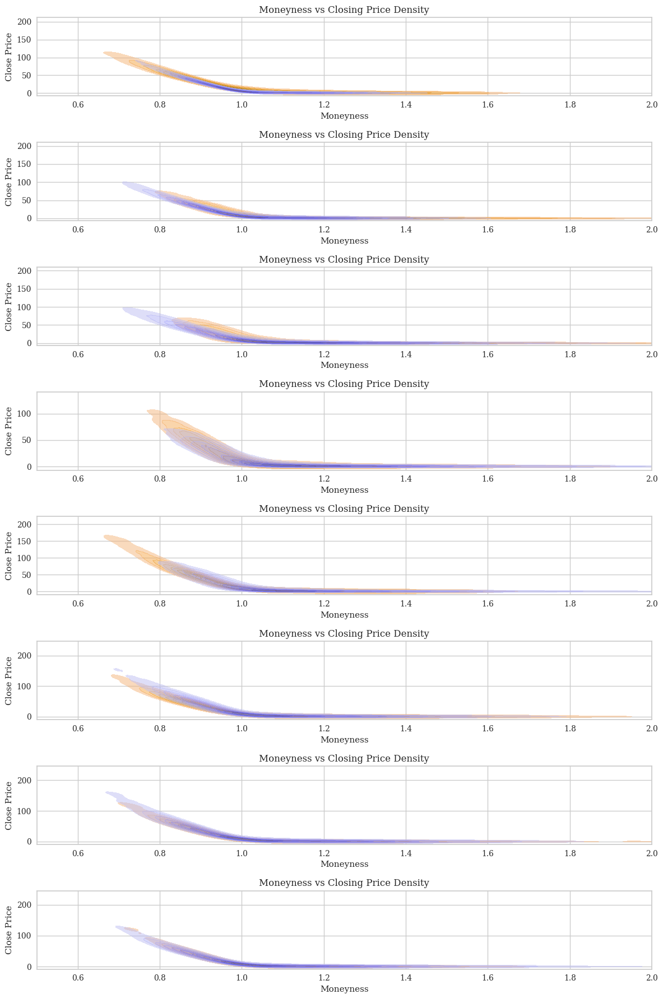

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

# 그래프 크기 설정
fig, axs = plt.subplots(8, 1, figsize=(12, 18))  # 6행 1열로 배치, 크기를 조정
xlim_range = (0.5, 2.0)  # x축 범위 설정

# Train 색상 및 마커 설정
train_color = 'blue'
train_marker = 'o'  # 원형 마커
train_size = 10  # Train 데이터의 마커 크기 설정
train_alpha = 0.75  # 불투명도 설정

# Test 색상 및 마커 설정
test_color = 'orange'
test_marker = 'X'  # X 마커
test_size = 10  # Test 데이터의 마커 크기 설정
test_alpha = 0.25  # 불투명도 설정

# KDE 매개변수
bw_adjust = 0.5  # 커널 폭을 줄여서 밀도를 더 명확히 강조
thresh = 0.1  # 밀도가 0.1 이하인 영역은 채우지 않음

for i, (train_data, test_data, label) in enumerate([
    (data1_train, data1_test, 'Data1'),
    (data2_train, data2_test, 'Data2'),
    (data3_train, data3_test, 'Data3'),
    (data4_train, data4_test, 'Data4'),
    (data5_train, data5_test, 'Data5'),
    (data6_train, data6_test, 'Data6'),
    (data7_train, data7_test, 'Data7'),
    (data8_train, data8_test, 'Data8')
]):
    # Train 데이터의 밀도 플롯
    sns.kdeplot(x='moneyness', y='close price', data=test_data, color=test_color, alpha=0.5, ax=axs[i], fill=True,  common_norm=False,bw_adjust=bw_adjust, thresh=thresh)
    sns.kdeplot(x='moneyness', y='close price', data=train_data, color=train_color, alpha=0.5, ax=axs[i], fill=True,  common_norm=False, bw_adjust=bw_adjust, thresh=thresh)
            
    axs[i].set_title(f'Moneyness vs Closing Price Density')
    axs[i].set_xlabel('Moneyness')
    axs[i].set_ylabel('Close Price')
    axs[i].set_xlim(xlim_range)
    axs[i].legend()

# 레이아웃 조정
plt.tight_layout()
output_path = 'moneyness_splits_enhanced_density.svg'
plt.savefig(output_path, format='svg', bbox_inches='tight')
plt.show()


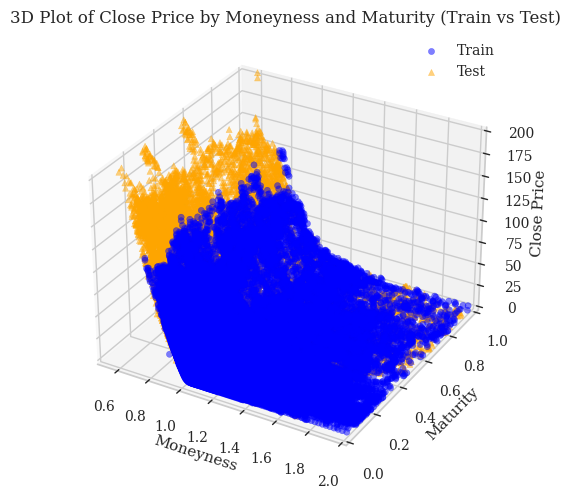

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from mpl_toolkits.mplot3d import Axes3D

# 3D 그래프 그리기 위한 데이터 준비
data5_train['dataset'] = 'Train'
data5_test['dataset'] = 'Test'
combined_data = pd.concat([data5_train, data5_test], ignore_index=True)

# 그래프 크기 설정
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(111, projection='3d')

# Train 데이터와 Test 데이터를 구분해서 색상 설정
data_train = combined_data[(combined_data['dataset'] == 'Train') & (combined_data['moneyness'] >= 0.5) & (combined_data['moneyness'] <= 2.0) & (combined_data['time to maturity'] >= 0.0) & (combined_data['time to maturity'] <= 1.0)]
data_test = combined_data[(combined_data['dataset'] == 'Test') & (combined_data['moneyness'] >= 0.5) & (combined_data['moneyness'] <= 2.0) & (combined_data['time to maturity'] >= 0.0) & (combined_data['time to maturity'] <= 1.0)]

# 3D 산점도 플롯
ax.scatter(data_train['moneyness'], data_train['time to maturity'], data_train['close price'], c='blue', label='Train', alpha=0.5, marker='o')
ax.scatter(data_test['moneyness'], data_test['time to maturity'], data_test['close price'], c='orange', label='Test', alpha=0.5, marker='^')

# 축 레이블 설정
ax.set_title('3D Plot of Close Price by Moneyness and Maturity (Train vs Test)')
ax.set_xlabel('Moneyness')
ax.set_ylabel('Maturity')
ax.set_zlabel('Close Price')
ax.set_xlim(0.5, 2.0)
ax.set_ylim(0.0, 1.0)
ax.set_zlim(0, 200)
ax.legend()

# 그래프 출력
plt.tight_layout()
plt.show()

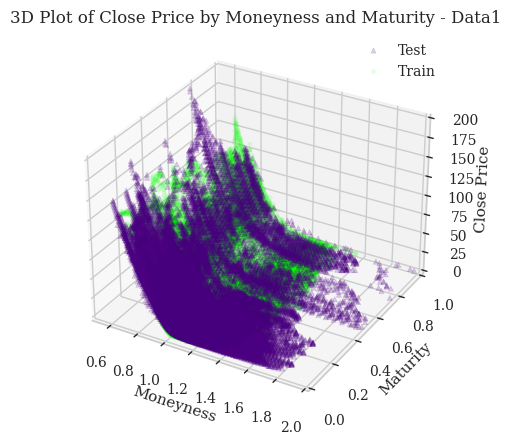

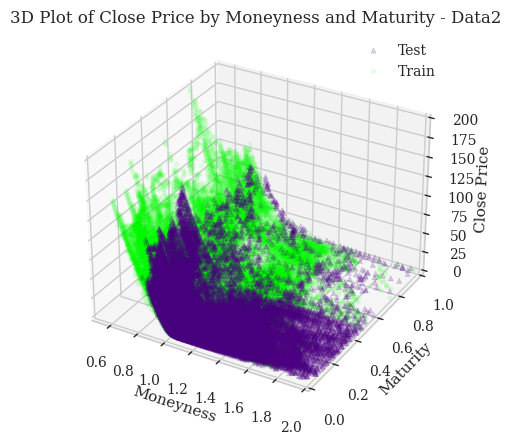

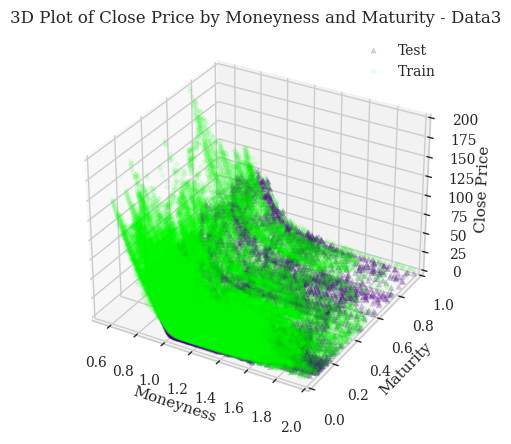

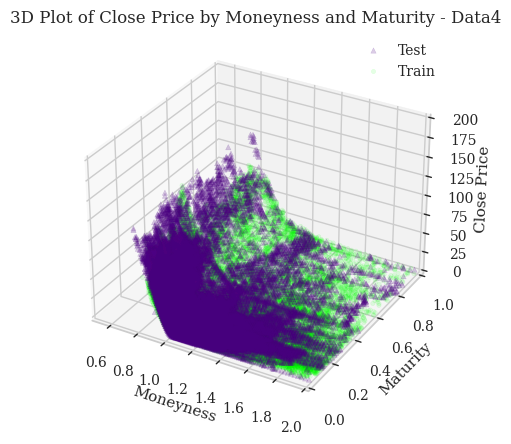

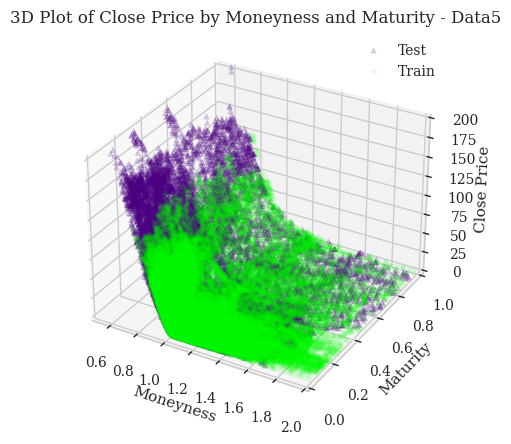

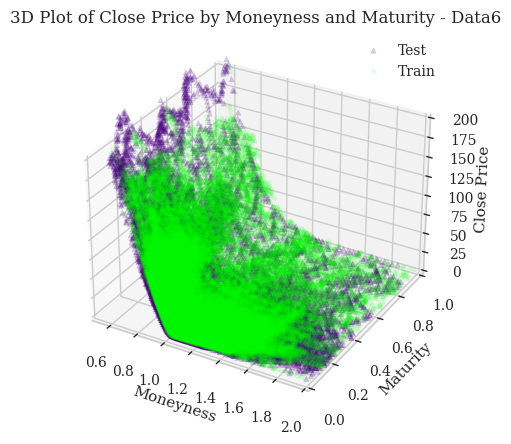

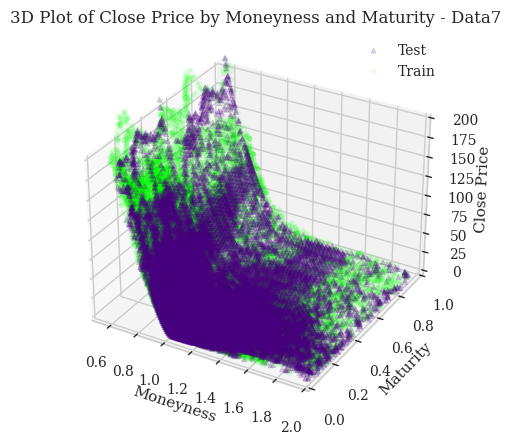

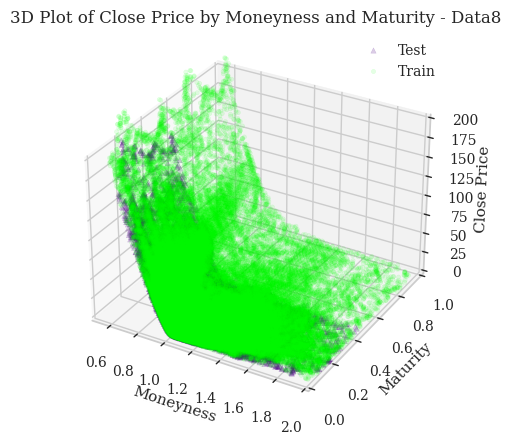

In [48]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D

# 데이터 준비
datasets = [
    (data1_train, data1_test, 'Data1'),
    (data2_train, data2_test, 'Data2'),
    (data3_train, data3_test, 'Data3'),
    (data4_train, data4_test, 'Data4'),
    (data5_train, data5_test, 'Data5'),
    (data6_train, data6_test, 'Data6'),
    (data7_train, data7_test, 'Data7'),
    (data8_train, data8_test, 'Data8')
]

# 그래프 그리기
for i, (train_data, test_data, label) in enumerate(datasets):
    # Train/Test 데이터에 'dataset' 열 추가
    train_data['dataset'] = 'Train'
    test_data['dataset'] = 'Test'
    
    # Train과 Test 데이터를 결합
    combined_data = pd.concat([train_data, test_data], ignore_index=True)
    
    # 필터링 조건 적용
    data_train = combined_data[(combined_data['dataset'] == 'Train') & 
                               (combined_data['moneyness'] >= 0.5) & 
                               (combined_data['moneyness'] <= 2.0) & 
                               (combined_data['time to maturity'] >= 0.0) & 
                               (combined_data['time to maturity'] <= 1.0)]
    data_test = combined_data[(combined_data['dataset'] == 'Test') & 
                              (combined_data['moneyness'] >= 0.5) & 
                              (combined_data['moneyness'] <= 2.0) & 
                              (combined_data['time to maturity'] >= 0.0) & 
                              (combined_data['time to maturity'] <= 1.0)]
    
    # 그래프 생성
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, projection='3d')
    
    # 3D 산점도 플롯: Test 데이터를 마지막에 그려 항상 위에 표시
    ax.scatter(data_test['moneyness'], data_test['time to maturity'], data_test['close price'], c='indigo', label='Test', alpha=0.2, marker='^', s=15)
    ax.scatter(data_train['moneyness'], data_train['time to maturity'], data_train['close price'], c='lime', label='Train', alpha=0.1, marker='o', s=10)
        
    # 축 레이블과 제목 설정
    ax.set_title(f'3D Plot of Close Price by Moneyness and Maturity - {label}')
    ax.set_xlabel('Moneyness')
    ax.set_ylabel('Maturity')
    ax.set_zlabel('Close Price')
    ax.set_xlim(0.5, 2.0)
    ax.set_ylim(0.0, 1.0)
    ax.set_zlim(0, 200)
    ax.legend()
    
    # 그래프 저장
    output_path = f'moneyness_maturity_3Dplot_{label}.svg'
    plt.savefig(output_path, format='svg', bbox_inches='tight')
    
    # 그래프 출력
    plt.show()


In [49]:
features = ['stock price', 'strike price', 'moneyness', 'time to maturity', 'kvix', 'rate']

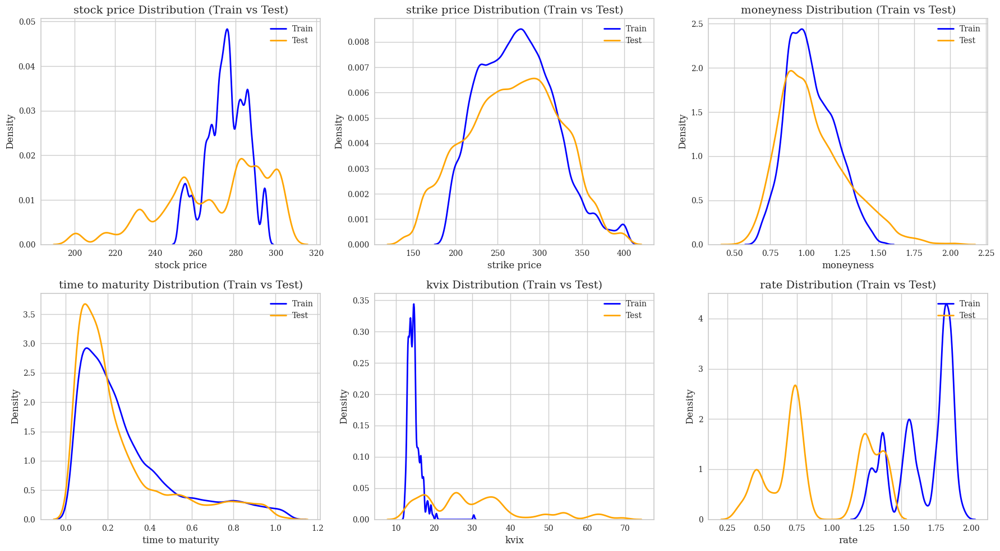

In [50]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3  # 2x3 배열에 맞게 row와 col 계산
    sns.kdeplot(data1_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data1_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

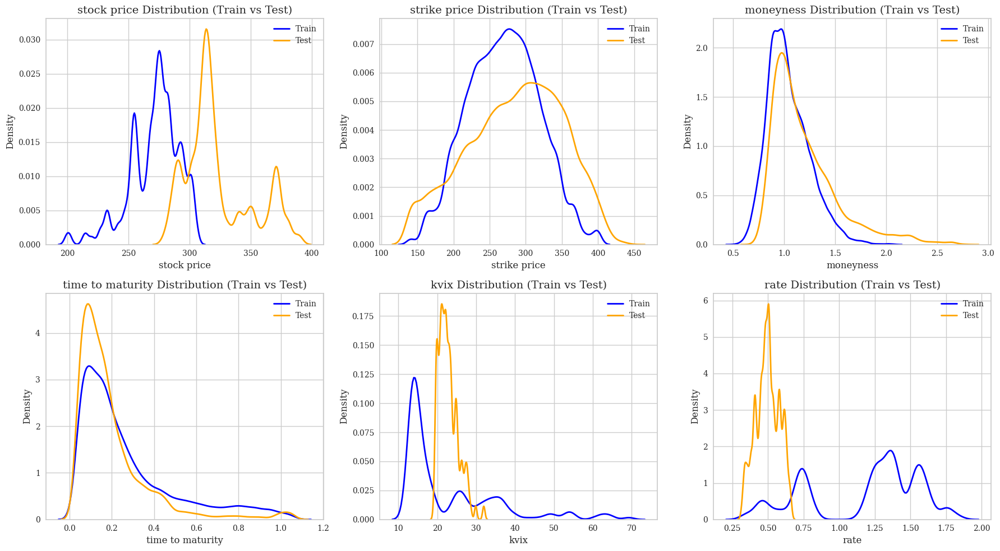

In [51]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3
    sns.kdeplot(data2_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data2_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

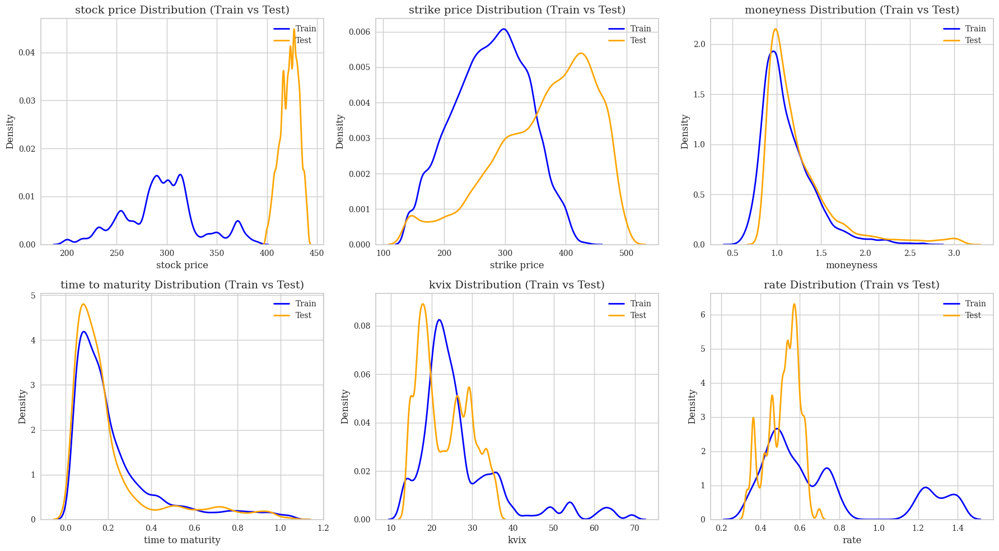

In [52]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3
    sns.kdeplot(data3_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data3_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

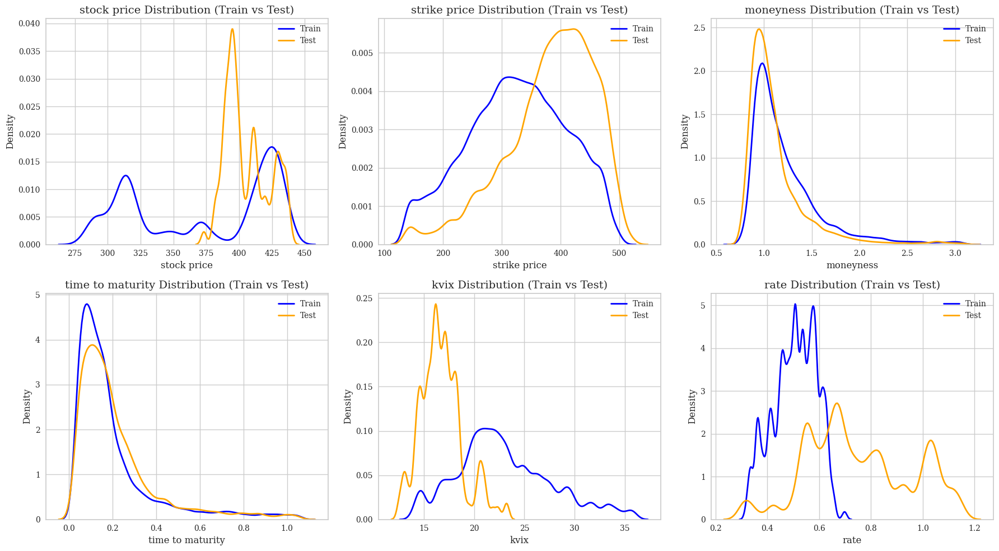

In [53]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3
    sns.kdeplot(data4_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data4_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

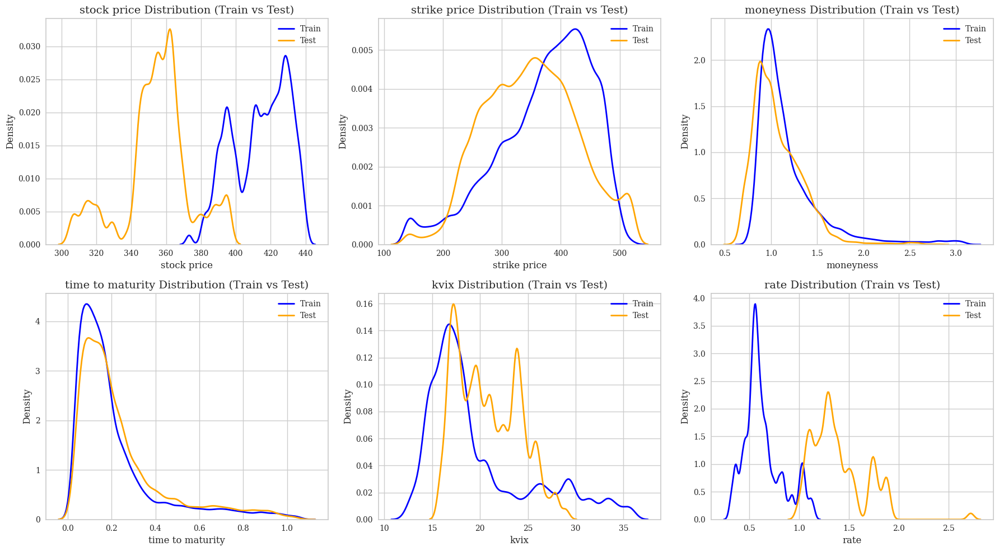

In [54]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3
    sns.kdeplot(data5_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data5_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

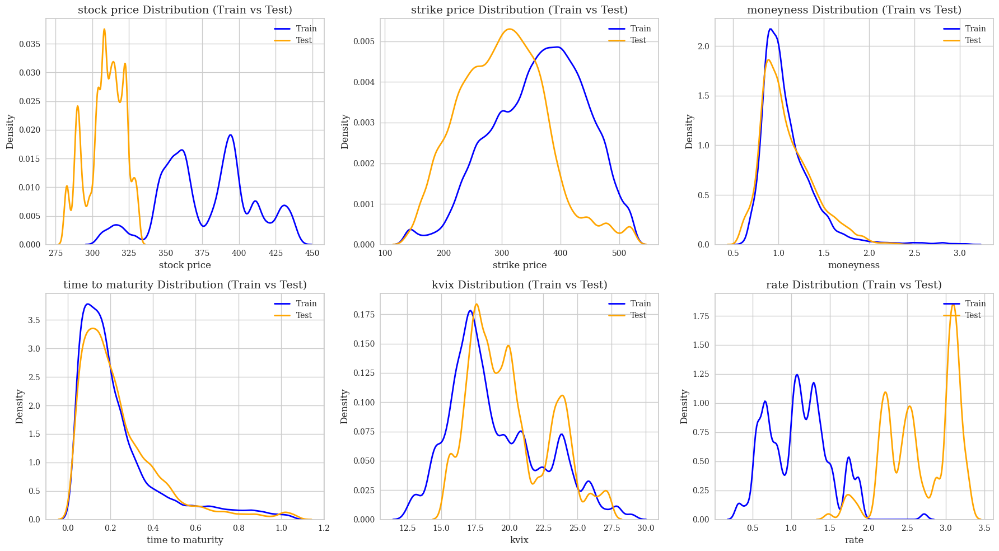

In [55]:
fig, axs = plt.subplots(2, 3, figsize=(18, 10))

for i, feature in enumerate(features):
    row, col = i // 3, i % 3
    sns.kdeplot(data6_train[feature], color='blue', lw=2, ax=axs[row, col], label='Train')
    sns.kdeplot(data6_test[feature], color='orange', lw=2, ax=axs[row, col], label='Test')
    axs[row, col].set_title(f'{feature} Distribution (Train vs Test)', fontsize=14)
    axs[row, col].set_xlabel(feature, fontsize=12)
    axs[row, col].set_ylabel('Density', fontsize=12)
    axs[row, col].legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.show()

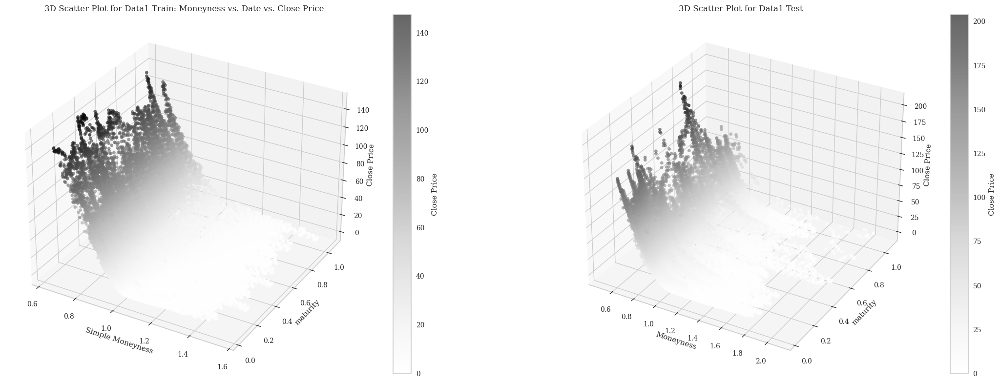

In [56]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data1_train['moneyness'], data1_train['time to maturity'], data1_train['close price'], c=data1_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data1 Train: Moneyness vs. Date vs. Close Price')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data1_test['moneyness'], data1_test['time to maturity'], data1_test['close price'], c=data1_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data1 Test')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data1_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

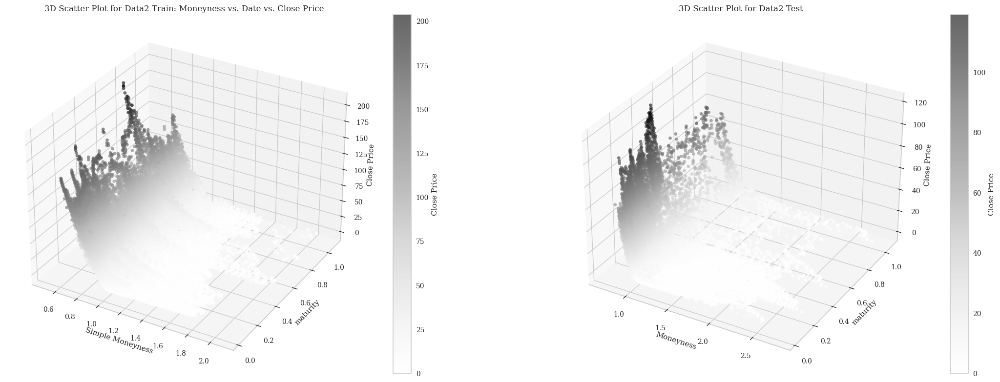

In [57]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data2_train['moneyness'], data2_train['time to maturity'], data2_train['close price'], c=data2_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data2 Train: Moneyness vs. Date vs. Close Price')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data2_test['moneyness'], data2_test['time to maturity'], data2_test['close price'], c=data2_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data2 Test')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data2_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

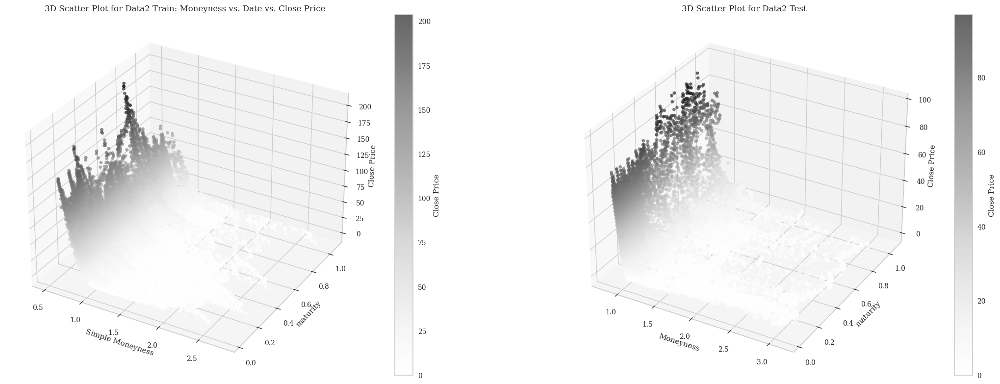

In [58]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data3_train['moneyness'], data3_train['time to maturity'], data3_train['close price'], c=data3_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data2 Train: Moneyness vs. Date vs. Close Price')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data3_test['moneyness'], data3_test['time to maturity'], data3_test['close price'], c=data3_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data2 Test')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data2_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

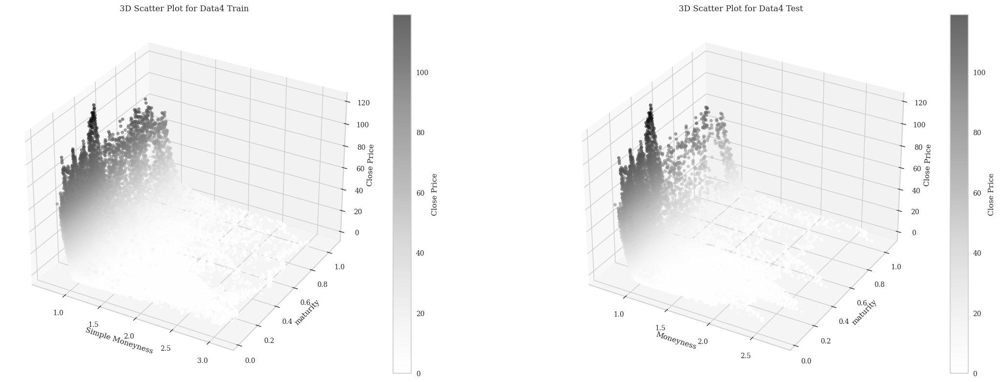

In [59]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data4_train['moneyness'], data4_train['time to maturity'], data4_train['close price'], c=data4_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data4 Train')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data2_test['moneyness'], data2_test['time to maturity'], data2_test['close price'], c=data2_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data4 Test')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data2_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

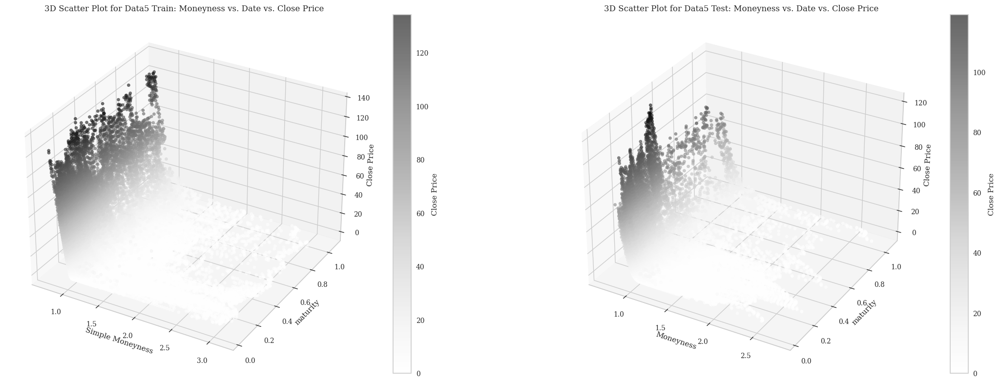

In [60]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data5_train['moneyness'], data5_train['time to maturity'], data5_train['close price'], c=data5_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data5 Train: Moneyness vs. Date vs. Close Price')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data2_test['moneyness'], data2_test['time to maturity'], data2_test['close price'], c=data2_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data5 Test: Moneyness vs. Date vs. Close Price')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data2_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

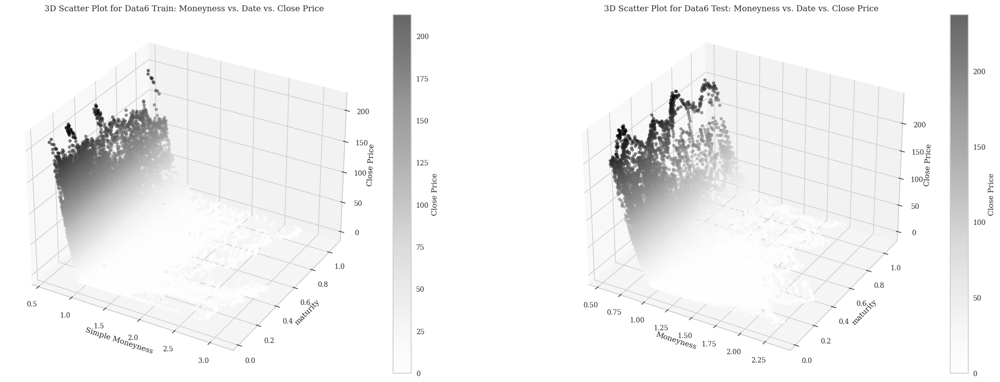

In [61]:
fig = plt.figure(figsize=(24, 8))

# 1. 3D Scatter Plot for Data1 Train
ax1 = fig.add_subplot(121, projection='3d')
scatter1 = ax1.scatter(data6_train['moneyness'], data6_train['time to maturity'], data6_train['close price'], c=data6_train['close price'], alpha=0.6)
fig.colorbar(scatter1, ax=ax1, label='Close Price')
ax1.set_title('3D Scatter Plot for Data6 Train: Moneyness vs. Date vs. Close Price')
ax1.set_xlabel('Simple Moneyness')
ax1.set_ylabel('maturity')
ax1.set_zlabel('Close Price')

# 2. 3D Scatter Plot for Data1 Test
ax2 = fig.add_subplot(122, projection='3d')
scatter2 = ax2.scatter(data6_test['moneyness'], data6_test['time to maturity'], data6_test['close price'], c=data6_test['close price'], alpha=0.6)
fig.colorbar(scatter2, ax=ax2, label='Close Price')
ax2.set_title('3D Scatter Plot for Data6 Test: Moneyness vs. Date vs. Close Price')
ax2.set_xlabel('Moneyness')
ax2.set_ylabel('maturity')
ax2.set_zlabel('Close Price')

plt.tight_layout()
# plt.savefig(f'{output_dir}/data2_3d_scatter_moneyness_vs_date_vs_close_price.svg')
plt.show()

In [62]:
data1_train['moneyness'] = pd.to_numeric(data1_train['moneyness'], errors='coerce')
data1_train['time to maturity'] = pd.to_numeric(data1_train['time to maturity'], errors='coerce')

data1_test['moneyness'] = pd.to_numeric(data1_test['moneyness'], errors='coerce')
data1_test['time to maturity'] = pd.to_numeric(data1_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data1_train = data1_train.dropna(subset=['moneyness', 'time to maturity'])
data1_test = data1_test.dropna(subset=['moneyness', 'time to maturity'])

# Remove infinite values
data1_train = data1_train[np.isfinite(data1_train['moneyness']) & np.isfinite(data1_train['time to maturity'])]
data1_test = data1_test[np.isfinite(data1_test['moneyness']) & np.isfinite(data1_test['time to maturity'])]

# Ensure both datasets use the same scale for x and y axes
min_moneyness = min(data1_train['moneyness'].min(), data1_test['moneyness'].min())
max_moneyness = max(data1_train['moneyness'].max(), data1_test['moneyness'].max())

min_maturity = min(data1_train['time to maturity'].min(), data1_test['time to maturity'].min())
max_maturity = max(data1_train['time to maturity'].max(), data1_test['time to maturity'].max())

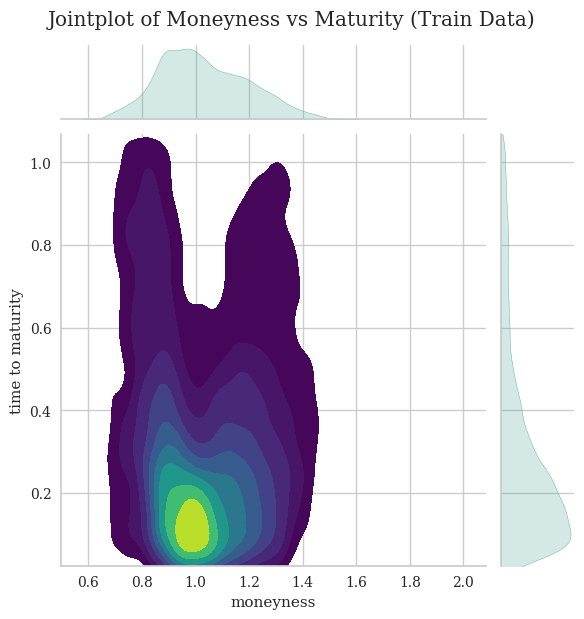

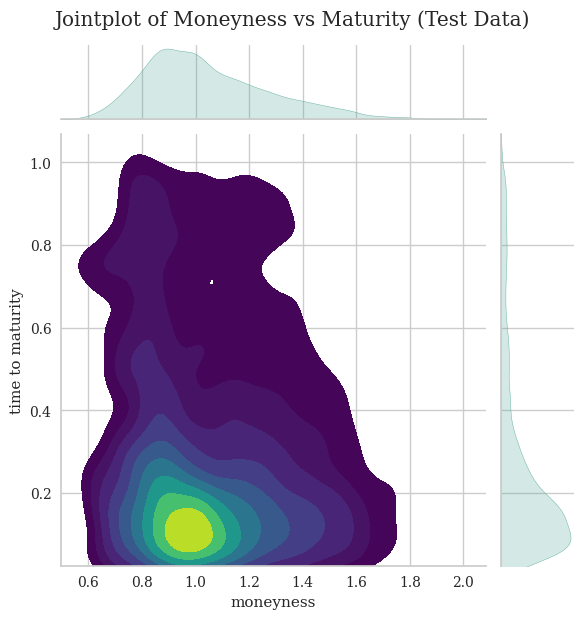

In [63]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data1_train['moneyness'], y=data1_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data1_test['moneyness'], y=data1_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()

In [64]:
# Ensure that both train and test data use the same scale for x and y axes
min_moneyness = min(data2_train['moneyness'].min(), data2_test['moneyness'].min())
max_moneyness = max(data2_train['moneyness'].max(), data2_test['moneyness'].max())

min_maturity = min(data2_train['time to maturity'].min(), data2_test['time to maturity'].min())
max_maturity = max(data2_train['time to maturity'].max(), data2_test['time to maturity'].max())

# Ensure all columns are strictly numeric and remove non-numeric values, infinities, and NaNs
data2_train['moneyness'] = pd.to_numeric(data2_train['moneyness'], errors='coerce')
data2_train['time to maturity'] = pd.to_numeric(data2_train['time to maturity'], errors='coerce')

data2_test['moneyness'] = pd.to_numeric(data2_test['moneyness'], errors='coerce')
data2_test['time to maturity'] = pd.to_numeric(data2_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data2_train = data2_train.dropna(subset=['moneyness', 'time to maturity'])
data2_test = data2_test.dropna(subset=['moneyness', 'time to maturity'])

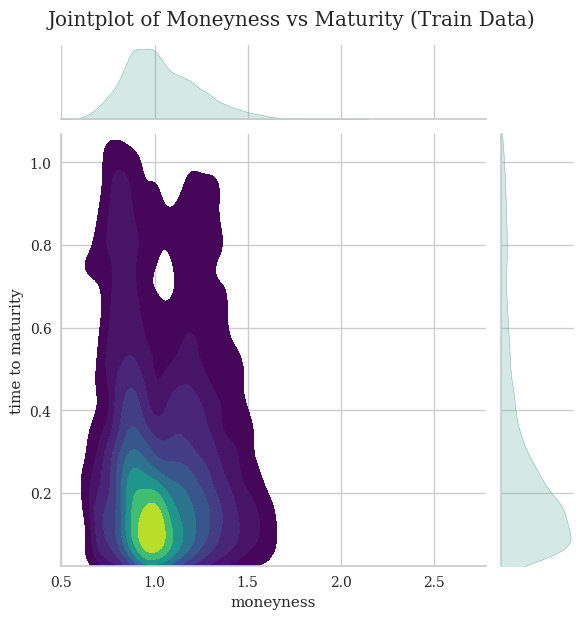

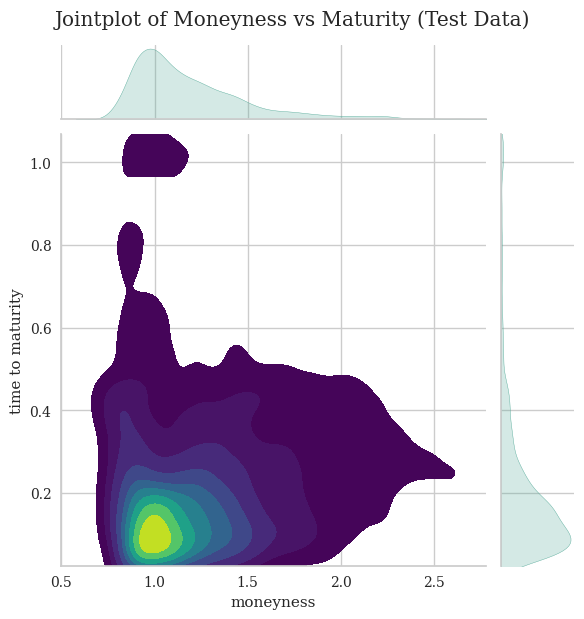

In [65]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data2_train['moneyness'], y=data2_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data2_test['moneyness'], y=data2_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()


In [66]:
# Ensure that both train and test data use the same scale for x and y axes
min_moneyness = min(data3_train['moneyness'].min(), data3_test['moneyness'].min())
max_moneyness = max(data3_train['moneyness'].max(), data3_test['moneyness'].max())

min_maturity = min(data3_train['time to maturity'].min(), data3_test['time to maturity'].min())
max_maturity = max(data3_train['time to maturity'].max(), data3_test['time to maturity'].max())

# Ensure all columns are strictly numeric and remove non-numeric values, infinities, and NaNs
data3_train['moneyness'] = pd.to_numeric(data3_train['moneyness'], errors='coerce')
data3_train['time to maturity'] = pd.to_numeric(data3_train['time to maturity'], errors='coerce')

data3_test['moneyness'] = pd.to_numeric(data3_test['moneyness'], errors='coerce')
data3_test['time to maturity'] = pd.to_numeric(data3_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data3_train = data3_train.dropna(subset=['moneyness', 'time to maturity'])
data3_test = data3_test.dropna(subset=['moneyness', 'time to maturity'])

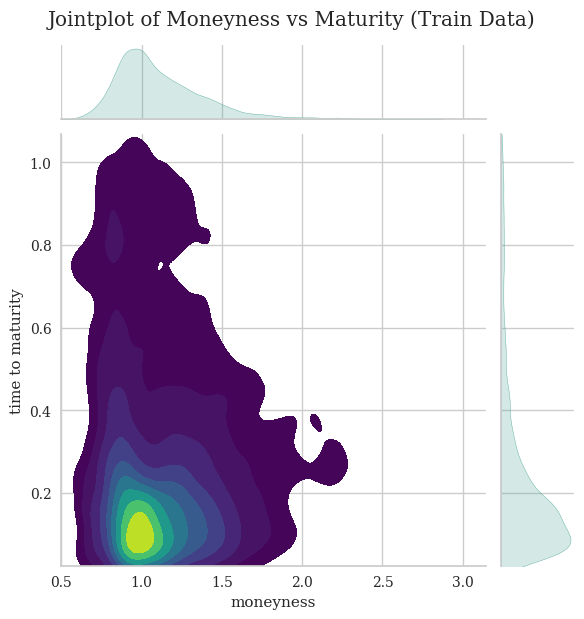

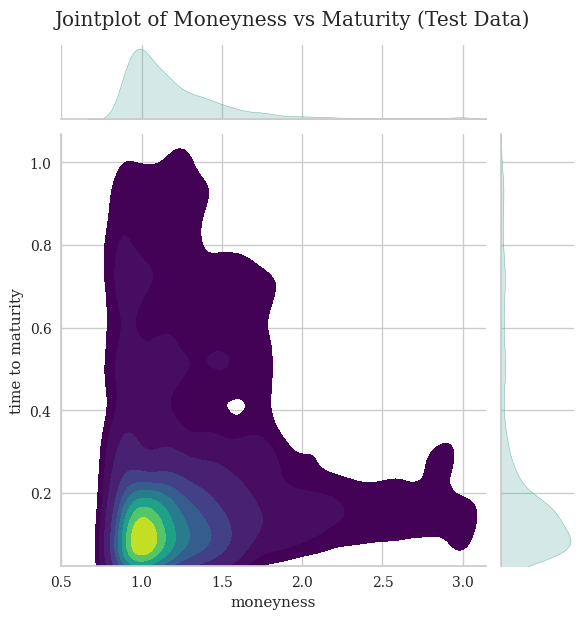

In [67]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data3_train['moneyness'], y=data3_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data3_test['moneyness'], y=data3_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()


In [68]:
# Ensure that both train and test data use the same scale for x and y axes
min_moneyness = min(data4_train['moneyness'].min(), data4_test['moneyness'].min())
max_moneyness = max(data4_train['moneyness'].max(), data4_test['moneyness'].max())

min_maturity = min(data4_train['time to maturity'].min(), data4_test['time to maturity'].min())
max_maturity = max(data4_train['time to maturity'].max(), data4_test['time to maturity'].max())

# Ensure all columns are strictly numeric and remove non-numeric values, infinities, and NaNs
data4_train['moneyness'] = pd.to_numeric(data4_train['moneyness'], errors='coerce')
data4_train['time to maturity'] = pd.to_numeric(data4_train['time to maturity'], errors='coerce')

data4_test['moneyness'] = pd.to_numeric(data4_test['moneyness'], errors='coerce')
data4_test['time to maturity'] = pd.to_numeric(data4_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data4_train = data4_train.dropna(subset=['moneyness', 'time to maturity'])
data4_test = data4_test.dropna(subset=['moneyness', 'time to maturity'])

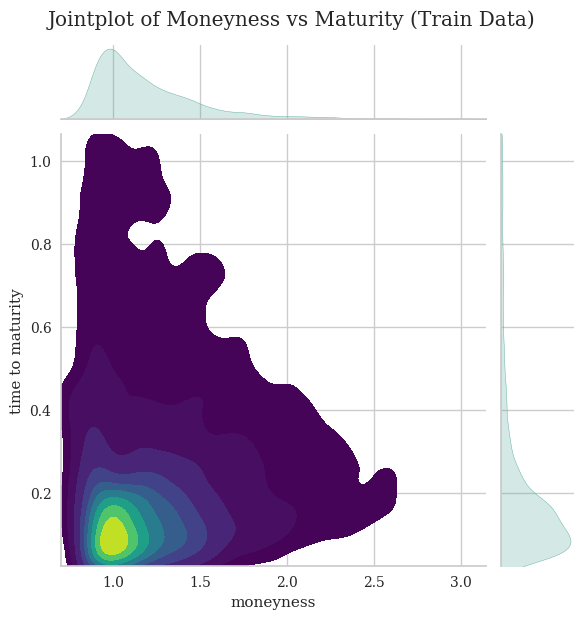

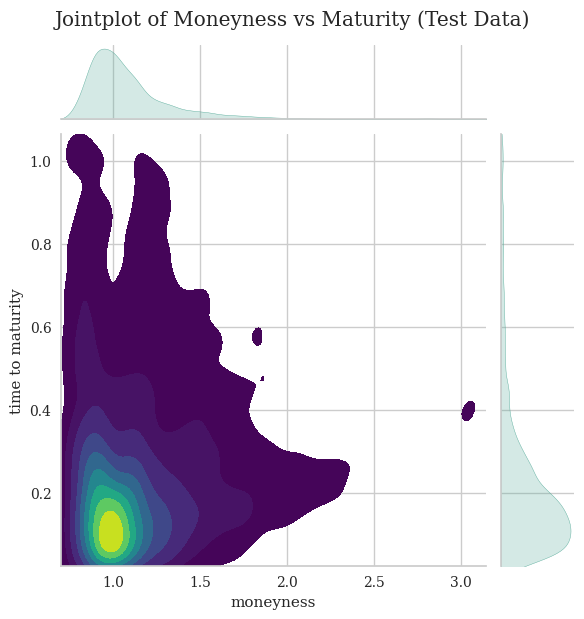

In [69]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data4_train['moneyness'], y=data4_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data4_test['moneyness'], y=data4_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()


In [70]:
# Ensure that both train and test data use the same scale for x and y axes
min_moneyness = min(data5_train['moneyness'].min(), data5_test['moneyness'].min())
max_moneyness = max(data5_train['moneyness'].max(), data5_test['moneyness'].max())

min_maturity = min(data5_train['time to maturity'].min(), data5_test['time to maturity'].min())
max_maturity = max(data5_train['time to maturity'].max(), data5_test['time to maturity'].max())

# Ensure all columns are strictly numeric and remove non-numeric values, infinities, and NaNs
data5_train['moneyness'] = pd.to_numeric(data5_train['moneyness'], errors='coerce')
data5_train['time to maturity'] = pd.to_numeric(data5_train['time to maturity'], errors='coerce')

data5_test['moneyness'] = pd.to_numeric(data5_test['moneyness'], errors='coerce')
data5_test['time to maturity'] = pd.to_numeric(data5_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data5_train = data5_train.dropna(subset=['moneyness', 'time to maturity'])
data5_test = data5_test.dropna(subset=['moneyness', 'time to maturity'])

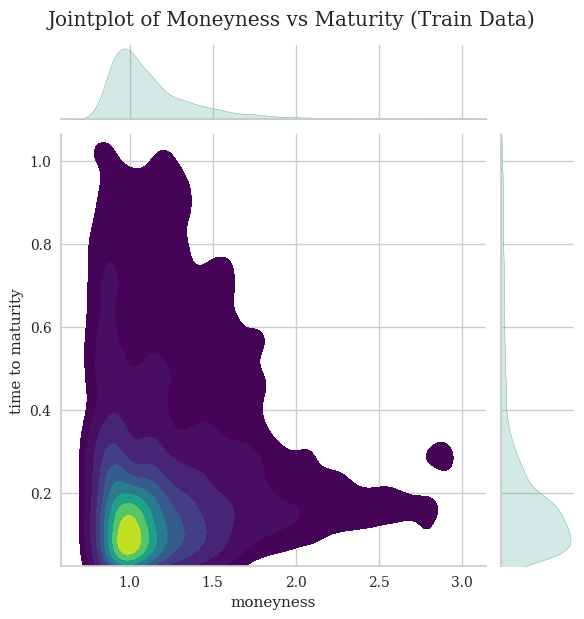

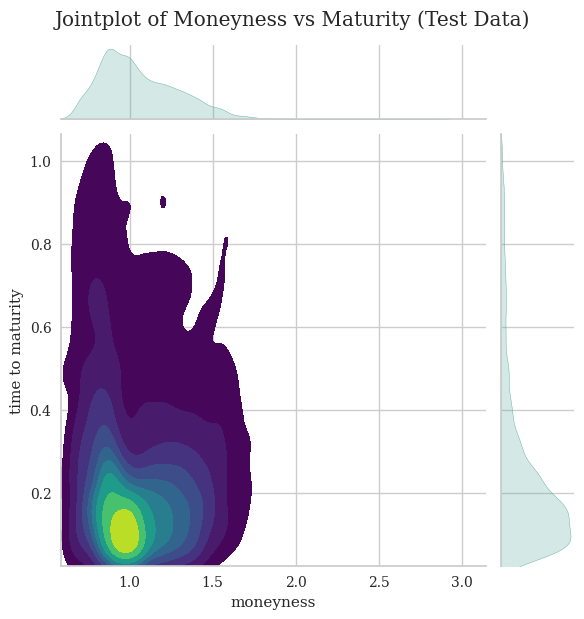

In [71]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data5_train['moneyness'], y=data5_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data5_test['moneyness'], y=data5_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()


In [72]:
# Ensure that both train and test data use the same scale for x and y axes
min_moneyness = min(data6_train['moneyness'].min(), data6_test['moneyness'].min())
max_moneyness = max(data6_train['moneyness'].max(), data6_test['moneyness'].max())

min_maturity = min(data6_train['time to maturity'].min(), data6_test['time to maturity'].min())
max_maturity = max(data6_train['time to maturity'].max(), data6_test['time to maturity'].max())

# Ensure all columns are strictly numeric and remove non-numeric values, infinities, and NaNs
data6_train['moneyness'] = pd.to_numeric(data6_train['moneyness'], errors='coerce')
data6_train['time to maturity'] = pd.to_numeric(data6_train['time to maturity'], errors='coerce')

data6_test['moneyness'] = pd.to_numeric(data6_test['moneyness'], errors='coerce')
data6_test['time to maturity'] = pd.to_numeric(data6_test['time to maturity'], errors='coerce')

# Drop rows with NaN or infinite values
data6_train = data6_train.dropna(subset=['moneyness', 'time to maturity'])
data6_test = data6_test.dropna(subset=['moneyness', 'time to maturity'])

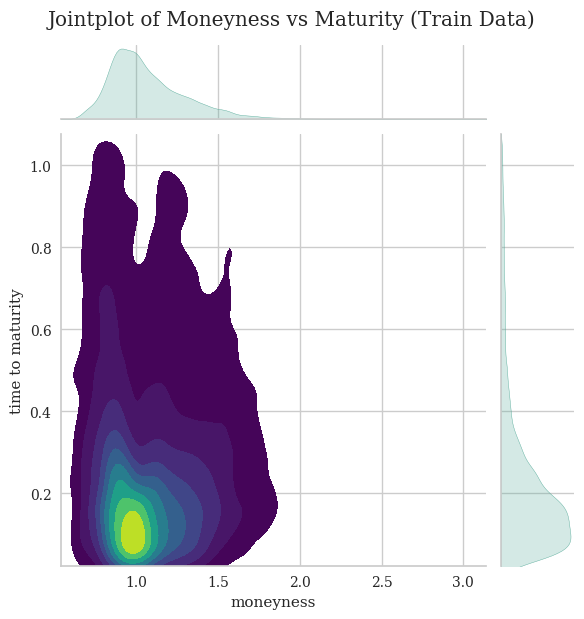

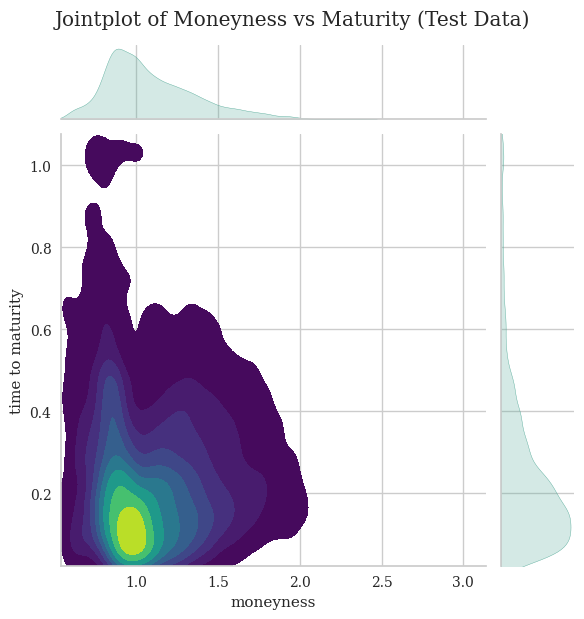

In [73]:
# Jointplot for Train Data
g1 = sns.jointplot(x=data6_train['moneyness'], y=data6_train['time to maturity'], kind="kde", fill=True, cmap='viridis')
g1.ax_joint.set_xlim(min_moneyness, max_moneyness)
g1.ax_joint.set_ylim(min_maturity, max_maturity)
g1.fig.suptitle('Jointplot of Moneyness vs Maturity (Train Data)', y=1.03)  # Title for the first plot
plt.show()

# Jointplot for Test Data
g2 = sns.jointplot(x=data6_test['moneyness'], y=data6_test['time to maturity'], kind="kde", fill=True, cmap='viridis')
g2.ax_joint.set_xlim(min_moneyness, max_moneyness)
g2.ax_joint.set_ylim(min_maturity, max_maturity)
g2.fig.suptitle('Jointplot of Moneyness vs Maturity (Test Data)', y=1.03)  # Title for the second plot
plt.show()


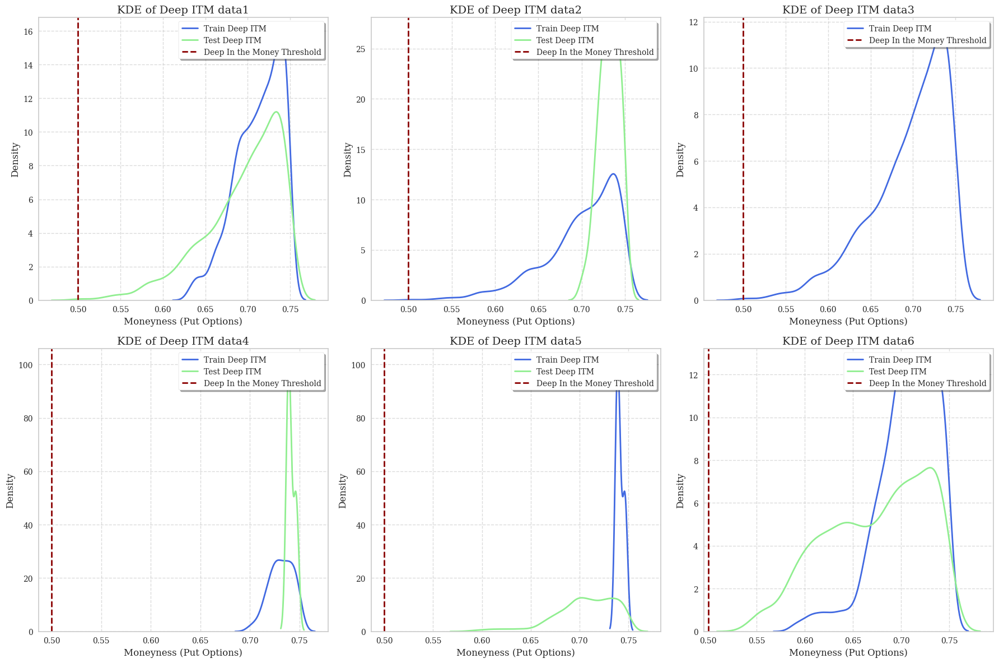

In [74]:
datasets = {
    'data1': (data1_train, data1_test),
    'data2': (data2_train, data2_test),
    'data3': (data3_train, data3_test),
    'data4': (data4_train, data4_test),
    'data5': (data5_train, data5_test),
    'data6': (data6_train, data6_test),
}

# Create subplots
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Loop through each dataset and create KDE plots
for i, (key, (train_data, test_data)) in enumerate(datasets.items()):
    deep_in_the_money_train = train_data[train_data['moneyness'] < 0.75]
    deep_in_the_money_test = test_data[test_data['moneyness'] < 0.75]
    
    sns.kdeplot(deep_in_the_money_train['moneyness'], color='royalblue', label='Train Deep ITM', linewidth=2, ax=axes[i])
    sns.kdeplot(deep_in_the_money_test['moneyness'], color='lightgreen', label='Test Deep ITM', linewidth=2, ax=axes[i])
    
    axes[i].axvline(x=0.5, color='darkred', linestyle='--', linewidth=2, label='Deep In the Money Threshold')
    axes[i].set_title(f'KDE of Deep ITM {key}', fontsize=14)
    axes[i].set_xlabel('Moneyness (Put Options)', fontsize=12)
    axes[i].set_ylabel('Density', fontsize=12)
    axes[i].legend(fontsize=10, loc='upper right', frameon=True, shadow=True, fancybox=True)
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Adjust layout for better spacing
plt.tight_layout()
plt.show()


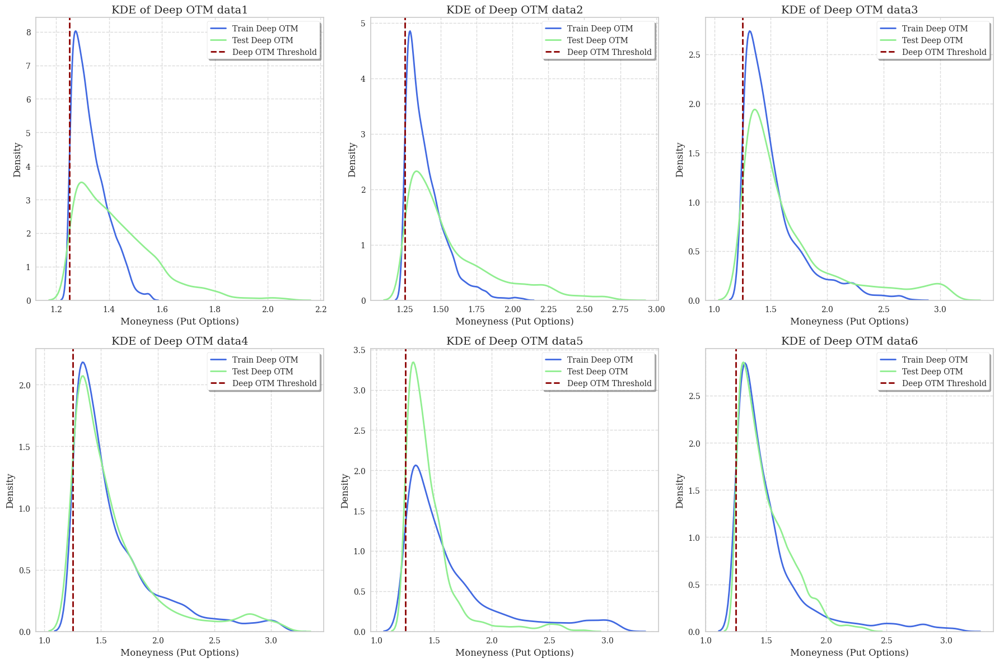

In [75]:

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Loop through each dataset and create KDE plots
for i, (key, (train_data, test_data)) in enumerate(datasets.items()):
    # Filter for Deep Out of the Money options (moneyness > 1.25)
    deep_out_the_money_train = train_data[train_data['moneyness'] > 1.25]
    deep_out_the_money_test = test_data[test_data['moneyness'] > 1.25]
    
    # Plot KDE for Train and Test datasets
    sns.kdeplot(deep_out_the_money_train['moneyness'], color='royalblue', label='Train Deep OTM', linewidth=2, ax=axes[i])
    sns.kdeplot(deep_out_the_money_test['moneyness'], color='lightgreen', label='Test Deep OTM', linewidth=2, ax=axes[i])
    
    # Add a vertical line to indicate the Deep Out of the Money threshold
    axes[i].axvline(x=1.25, color='darkred', linestyle='--', linewidth=2, label='Deep OTM Threshold')
    
    # Set titles and labels
    axes[i].set_title(f'KDE of Deep OTM {key}', fontsize=14)
    axes[i].set_xlabel('Moneyness (Put Options)', fontsize=12)
    axes[i].set_ylabel('Density', fontsize=12)
    
    # Adjust legend and grid for readability
    axes[i].legend(fontsize=10, loc='upper right', frameon=True, shadow=True, fancybox=True)
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Adjust layout for better spacing between plots
plt.tight_layout()

# Display the final plot
plt.show()


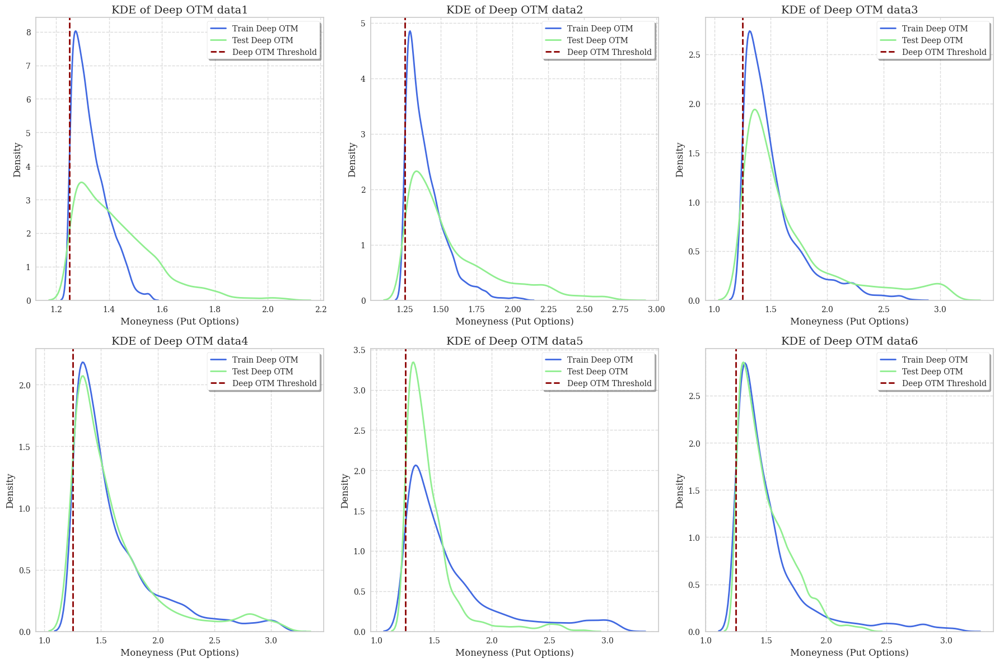

In [76]:

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

# Loop through each dataset and create KDE plots
for i, (key, (train_data, test_data)) in enumerate(datasets.items()):
    # Filter for Deep Out of the Money options (moneyness > 1.25)
    deep_out_the_money_train = train_data[train_data['moneyness'] > 1.25]
    deep_out_the_money_test = test_data[test_data['moneyness'] > 1.25]
    
    # Plot KDE for Train and Test datasets
    sns.kdeplot(deep_out_the_money_train['moneyness'], color='royalblue', label='Train Deep OTM', linewidth=2, ax=axes[i])
    sns.kdeplot(deep_out_the_money_test['moneyness'], color='lightgreen', label='Test Deep OTM', linewidth=2, ax=axes[i])
    
    # Add a vertical line to indicate the Deep Out of the Money threshold
    axes[i].axvline(x=1.25, color='darkred', linestyle='--', linewidth=2, label='Deep OTM Threshold')
    
    # Set titles and labels
    axes[i].set_title(f'KDE of Deep OTM {key}', fontsize=14)
    axes[i].set_xlabel('Moneyness (Put Options)', fontsize=12)
    axes[i].set_ylabel('Density', fontsize=12)
    
    # Adjust legend and grid for readability
    axes[i].legend(fontsize=10, loc='upper right', frameon=True, shadow=True, fancybox=True)
    axes[i].grid(True, linestyle='--', alpha=0.7)

# Adjust layout for better spacing between plots
plt.tight_layout()

# Display the final plot
plt.show()


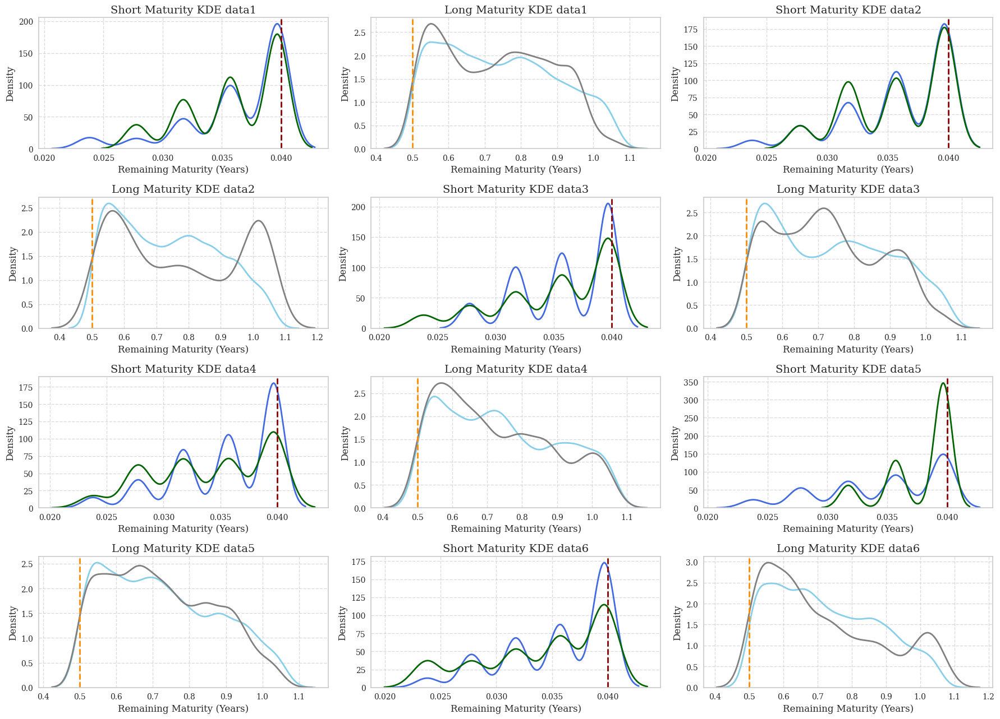

In [77]:
short_maturity_threshold = 0.04  # Short maturity (less than this value)
long_maturity_threshold = 0.5   # Long maturity (greater than this value)

# Create subplots
fig, axes = plt.subplots(4, 3, figsize=(18, 13))  # 4 rows and 3 columns for 12 plots
axes = axes.flatten()

# Loop through each dataset and create separate plots for short and long maturity
for i, (key, (train_data, test_data)) in enumerate(datasets.items()):
    short_maturity_train = train_data[train_data['time to maturity'] < short_maturity_threshold]
    long_maturity_train = train_data[train_data['time to maturity'] > long_maturity_threshold]
    
    short_maturity_test = test_data[test_data['time to maturity'] < short_maturity_threshold]
    long_maturity_test = test_data[test_data['time to maturity'] > long_maturity_threshold]
    
    sns.kdeplot(short_maturity_train['time to maturity'], color='royalblue', label='Train Short Maturity', linewidth=2, ax=axes[2 * i])
    sns.kdeplot(short_maturity_test['time to maturity'], color='darkgreen', label='Test Short Maturity', linewidth=2, ax=axes[2 * i])
    
    sns.kdeplot(long_maturity_train['time to maturity'], color='skyblue', label='Train Long Maturity', linewidth=2, ax=axes[2 * i + 1])
    sns.kdeplot(long_maturity_test['time to maturity'], color='gray', label='Test Long Maturity', linewidth=2, ax=axes[2 * i + 1])
    
    axes[2 * i].axvline(x=short_maturity_threshold, color='darkred', linestyle='--', linewidth=2, label='Short Maturity Threshold')
    axes[2 * i + 1].axvline(x=long_maturity_threshold, color='darkorange', linestyle='--', linewidth=2, label='Long Maturity Threshold')
    
    axes[2 * i].set_title(f'Short Maturity KDE {key}', fontsize=14)
    axes[2 * i].set_xlabel('Remaining Maturity (Years)', fontsize=12)
    axes[2 * i].set_ylabel('Density', fontsize=12)
    
    axes[2 * i + 1].set_title(f'Long Maturity KDE {key}', fontsize=14)
    axes[2 * i + 1].set_xlabel('Remaining Maturity (Years)', fontsize=12)
    axes[2 * i + 1].set_ylabel('Density', fontsize=12)
    
    # axes[2 * i].legend(fontsize=10, loc='upper right', frameon=True, shadow=True, fancybox=True)
    # axes[2 * i + 1].legend(fontsize=10, loc='upper right', frameon=True, shadow=True, fancybox=True)
    
    axes[2 * i].grid(True, linestyle='--', alpha=0.7)
    axes[2 * i + 1].grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

In [78]:
import pickle
data = pd.read_pickle('krx_data_5Y.pkl')

In [79]:
data = data[['today', '주식가격', 'kvix']]
data.rename(columns={'주식가격': 'kospi'}, inplace=True)
data.set_index('today', inplace=True)
data = data.groupby(data.index).first()
data.head(10)

,kospi,kvix
today,,
2019-01-02,258.23,19.74
2019-01-03,255.77,19.25
2019-01-04,257.89,17.96
2019-01-07,261.57,16.67
2019-01-08,259.65,16.13
2019-01-09,265.60,15.45
2019-01-10,265.55,15.01
2019-01-11,267.13,14.67
2019-01-14,264.99,14.97


In [80]:
import os
# 폴더가 없으면 생성
output_dir = "/home/jupyter-jihong0429/anomaly/plot"
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

NameError: name 'data1' is not defined

findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial, Liberation Sans, Bitstream Vera Sans, sans-serif
findfont: Generic family 'sans-serif' not found because none of the fo

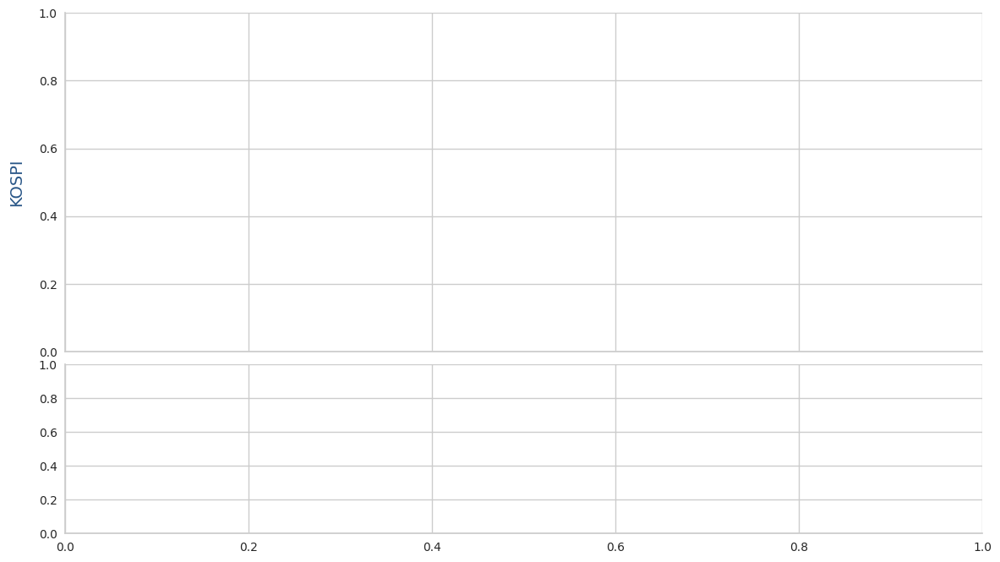

In [81]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.patches as mpatches
import pandas as pd

# --- (0) 전역 스타일 설정 ---
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.size': 11,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'legend.fontsize': 10,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'axes.spines.top': False,
    'axes.spines.right': False,
})

# --- (1) 워크포워드 스플릿 정의 ---
time_splits = [
    ("2019-01-01", "2019-12-31", "2020-01-01", "2020-06-30"),
    ("2019-07-01", "2020-06-30", "2020-07-01", "2020-12-31"),
    ("2020-01-01", "2020-12-31", "2021-01-01", "2021-06-30"),
    ("2020-07-01", "2021-06-30", "2021-07-01", "2021-12-31"),
    ("2021-01-01", "2021-12-31", "2022-01-01", "2022-06-30"),
    ("2021-07-01", "2022-06-30", "2022-07-01", "2022-12-31"),
    ("2022-01-01", "2022-12-31", "2023-01-01", "2023-06-30"),
    ("2022-07-01", "2023-06-30", "2023-07-01", "2023-12-31")
]
time_splits_dt = [
    (pd.to_datetime(ts), pd.to_datetime(te),
     pd.to_datetime(es), pd.to_datetime(ee))
    for ts, te, es, ee in time_splits
]
n_splits = len(time_splits_dt)

# data1: 미리 준비된 DataFrame
#   index = DatetimeIndex
#   columns = ['kospi', 'kvix']

# --- (2) Figure & Axes 생성: 위=시계열, 아래=간트 차트 ---
fig, (ax_ts, ax_gt) = plt.subplots(
    2, 1, figsize=(14, 8),
    sharex=True,
    gridspec_kw={'height_ratios': [2, 1], 'hspace': 0.05}
)

# --- (3) 시계열 플롯: KOSPI / KVIX ---
ax_ts.set_ylabel('KOSPI', color='#2a5788', fontsize=14, labelpad=12)
l1, = ax_ts.plot(
    data1.index, data1['kospi'],
    label='KOSPI', color='#2a5788', linewidth=2
)
ax_ts.tick_params(axis='y', labelcolor='#2a5788', labelsize=12)

ax_tsr = ax_ts.twinx()
ax_tsr.set_ylabel('KVIX', color='#c94641', fontsize=14, labelpad=12)
l2, = ax_tsr.plot(
    data1.index, data1['kvix'],
    label='KVIX', color='#c94641', linewidth=2
)
ax_tsr.tick_params(axis='y', labelcolor='#c94641', labelsize=12)

ax_ts.legend([l1, l2], ['KOSPI', 'KVIX'], loc='upper left', frameon=False)
ax_ts.tick_params(axis='x', labelrotation=45, labelsize=12)

# --- (4) 간트 차트: Train / Test 바 ---
for i, (ts, te, es, ee) in enumerate(time_splits_dt, start=1):
    tsn, ten = mdates.date2num(ts), mdates.date2num(te)
    esn, een = mdates.date2num(es), mdates.date2num(ee)
    ax_gt.barh(i, ten - tsn, left=tsn,
               height=0.5, color='#8fb9a8', alpha=0.8)
    ax_gt.barh(i, een - esn, left=esn,
               height=0.5, color='#f28e79', alpha=0.8)

ax_gt.set_ylim(0.5, n_splits + 0.5)
ax_gt.set_yticks(range(1, n_splits+1))
ax_gt.set_yticklabels(
    [f"Split {i}" for i in range(1, n_splits+1)],
    fontsize=11
)
ax_gt.invert_yaxis()
ax_gt.set_ylabel('Time Splits', fontsize=12, labelpad=10)
ax_gt.grid(axis='x', linestyle=':', color='grey', alpha=0.5)

train_patch = mpatches.Patch(color='#8fb9a8', label='Train')
test_patch  = mpatches.Patch(color='#f28e79', label='Test')
ax_gt.legend(
    handles=[train_patch, test_patch],
    loc='upper right', frameon=False, fontsize=10
)

# --- (5) 모든 경계일(Train start, Test start, 마지막 Test end)에 보조선 추가 ---
bounds = []
for ts, te, es, ee in time_splits_dt:
    bounds.extend([ts, es])
bounds.append(time_splits_dt[-1][3])  # 마지막 test_end
bounds = sorted(set(bounds))

for b in bounds:
    ax_ts.axvline(b, color='grey', linestyle='--', linewidth=0.8)
    ax_gt.axvline(b, color='grey', linestyle='--', linewidth=0.8)

# --- (6) x축 범위에 여백 추가 ---
first_start = time_splits_dt[0][0]
last_end    = time_splits_dt[-1][3]
margin      = pd.Timedelta(days=30)
ax_ts.set_xlim(first_start - margin, last_end + margin)

# --- (7) 레이아웃 정리 & 저장/표시 ---
plt.tight_layout()
plt.savefig("timeseries_split_plot.png", bbox_inches="tight")
plt.show()
